In [1]:
# ---------------------------------------------------------------------------
# Install required libraries (Colab already has TensorFlow, numpy, pandas, etc.
# pre-installed — we only install the extras and pin nothing that isn't needed).
# ---------------------------------------------------------------------------
!pip install -q albumentations opencv-python-headless pycocotools grad-cam kaggle tqdm scikit-learn seaborn reportlab --upgrade
print("Libraries installed.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 60.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.5/111.5 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 676.7/676.7 kB 53.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 110.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 106.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.5/247.5 kB 26.6 MB/s eta 0:00:00
Libraries installed.


In [2]:
# ---------------------------------------------------------------------------
# Core imports
# ---------------------------------------------------------------------------
import os
import cv2
import json
import time
import random
import shutil
import zipfile
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks, optimizers
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                              confusion_matrix, classification_report, roc_curve, auc,
                              precision_recall_curve)
from sklearn.preprocessing import label_binarize

import albumentations as A

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

# Enable memory growth so TF does not grab all GPU memory at once
gpus = tf.config.list_physical_devices('GPU')
for gpu in gpus:
    try:
        tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
# ---------------------------------------------------------------------------
# Global project configuration — change these in ONE place if needed
# ---------------------------------------------------------------------------
class CFG:
    IMG_SIZE      = 224                 # classifier input size (EfficientNetB0 default)
    SEG_SIZE      = 256                 # segmentation input size
    N_SAMPLES     = 1200                # subset size target (raised from 500)
    N_SAMPLES_MIN_PER_CLASS = 100        # don't sample a class below this if available
    N_SAMPLES_TARGET        = 1200       # total target; classes with surplus top up any shortfall
    N_CLASSES     = 6
    CLASSES       = ['Dent', 'Scratch', 'Crack', 'Glass Shatter', 'Lamp Broken', 'Tire Flat']
    BATCH_SIZE    = 16
    SEG_EPOCHS    = 25
    CLF_EPOCHS    = 20                   # raised from 15 -- more data supports more epochs
    FT_EPOCHS     = 15                   # raised from 10
    LR            = 1e-3
    FT_LR         = 1e-5
    TRAIN_SPLIT   = 0.70
    VAL_SPLIT     = 0.15
    TEST_SPLIT    = 0.15
    BASE_DIR      = '/content/cardd_project'
    RAW_DIR       = f'{BASE_DIR}/raw'
    DATA_DIR      = f'{BASE_DIR}/data'          # resized images + masks live here
    MODEL_DIR     = f'{BASE_DIR}/models'
    REPORT_DIR    = f'{BASE_DIR}/report'

for d in [CFG.BASE_DIR, CFG.RAW_DIR, CFG.DATA_DIR, CFG.MODEL_DIR, CFG.REPORT_DIR]:
    os.makedirs(d, exist_ok=True)

print("Project directories ready under:", CFG.BASE_DIR)


Project directories ready under: /content/cardd_project


In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
# ---------------------------------------------------------------------------
# Kaggle API authentication
# ---------------------------------------------------------------------------
from google.colab import files

if not os.path.exists('/root/.kaggle/kaggle.json'):
    print("Please upload your kaggle.json token file:")
    uploaded = files.upload()          # upload kaggle.json when prompted
    os.makedirs('/root/.kaggle', exist_ok=True)
    for fname in uploaded.keys():
        shutil.move(fname, '/root/.kaggle/kaggle.json')
    os.chmod('/root/.kaggle/kaggle.json', 0o600)

print("Kaggle credentials configured.")


Please upload your kaggle.json token file:


Saving kaggle(1).json to kaggle(1).json
Kaggle credentials configured.


In [6]:
# ---------------------------------------------------------------------------
# Download the CarDD dataset from Kaggle
# Dataset: https://www.kaggle.com/datasets/issamjebnouni/cardd
# (This mirrors the official CarDD release: COCO JSON annotations with
# polygon segmentation, organized into train/val/test folders.)
# ---------------------------------------------------------------------------
KAGGLE_DATASET_SLUG = "issamjebnouni/cardd"

zip_path = f"{CFG.RAW_DIR}/cardd.zip"
if not os.path.exists(zip_path):
    !kaggle datasets download -d {KAGGLE_DATASET_SLUG} -p {CFG.RAW_DIR}
    downloaded_zip = [f for f in os.listdir(CFG.RAW_DIR) if f.endswith('.zip')]
    if downloaded_zip:
        zip_path = os.path.join(CFG.RAW_DIR, downloaded_zip[0])

with zipfile.ZipFile(zip_path, 'r') as zf:
    zf.extractall(CFG.RAW_DIR)

print("Extraction complete. Top-level contents:")
print(os.listdir(CFG.RAW_DIR))


Dataset URL: https://www.kaggle.com/datasets/issamjebnouni/cardd
License(s): unknown


Extraction complete. Top-level contents:
['train.json', 'image_info.xlsx', 'train', 'val.json', 'val', 'test', 'cardd.zip', 'test.json']


In [7]:
# ---------------------------------------------------------------------------
# Display the extracted folder structure (2 levels deep) so we can see
# where images and annotation files actually live.
# ---------------------------------------------------------------------------
def print_tree(root, max_depth=3, _depth=0):
    if _depth > max_depth:
        return
    for item in sorted(os.listdir(root))[:20]:
        path = os.path.join(root, item)
        print("  " * _depth + ("[DIR] " if os.path.isdir(path) else "") + item)
        if os.path.isdir(path):
            print_tree(path, max_depth, _depth + 1)

print_tree(CFG.RAW_DIR)


cardd.zip
image_info.xlsx
[DIR] test
  000012.jpg
  000015.jpg
  000023.jpg
  000033.jpg
  000040.jpg
  000042.jpg
  000044.jpg
  000057.jpg
  000082.jpg
  000088.jpg
  000090.jpg
  000106.jpg
  000128.jpg
  000152.jpg
  000165.jpg
  000175.jpg
  000185.jpg
  000191.jpg
  000204.jpg
  000214.jpg
test.json
[DIR] train
  000001.jpg
  000002.jpg
  000003.jpg
  000004.jpg
  000005.jpg
  000006.jpg
  000007.jpg
  000008.jpg
  000009.jpg
  000010.jpg
  000011.jpg
  000014.jpg
  000018.jpg
  000019.jpg
  000020.jpg
  000021.jpg
  000022.jpg
  000026.jpg
  000027.jpg
  000028.jpg
train.json
[DIR] val
  000013.jpg
  000016.jpg
  000017.jpg
  000024.jpg
  000025.jpg
  000034.jpg
  000035.jpg
  000038.jpg
  000047.jpg
  000054.jpg
  000058.jpg
  000059.jpg
  000060.jpg
  000080.jpg
  000083.jpg
  000084.jpg
  000086.jpg
  000089.jpg
  000091.jpg
  000097.jpg
val.json


In [8]:
# ---------------------------------------------------------------------------
# Auto-locate image files and COCO-style annotation JSON files anywhere
# inside the extracted dataset, instead of assuming a fixed path.
# ---------------------------------------------------------------------------
IMG_EXTS = ('.jpg', '.jpeg', '.png')

all_images = []
all_json_annotations = []

for dirpath, _, filenames in os.walk(CFG.RAW_DIR):
    for fn in filenames:
        full = os.path.join(dirpath, fn)
        if fn.lower().endswith(IMG_EXTS):
            all_images.append(full)
        elif fn.lower().endswith('.json'):
            all_json_annotations.append(full)

print(f"Found {len(all_images)} image files.")
print(f"Found {len(all_json_annotations)} JSON files (candidate COCO annotation files):")
for j in all_json_annotations:
    print("  -", j)


Found 4000 image files.
Found 3 JSON files (candidate COCO annotation files):
  - /content/cardd_project/raw/train.json
  - /content/cardd_project/raw/val.json
  - /content/cardd_project/raw/test.json


In [9]:
def is_valid_coco_json(path):
    try:
        with open(path, 'r') as f:
            d = json.load(f)
        return isinstance(d, dict) and all(k in d for k in ('images', 'annotations', 'categories'))
    except Exception:
        return False

valid_coco_files = [p for p in all_json_annotations if is_valid_coco_json(p)]
print(f"Valid COCO-format annotation files found: {len(valid_coco_files)}")
for p in valid_coco_files:
    print("  -", p)

def merge_coco_files(paths):
    '''Merge multiple COCO json files (e.g. train/val/test) into one dict,
    re-indexing image and annotation ids so nothing collides.'''
    merged = {'images': [], 'annotations': [], 'categories': None}
    next_img_id, next_ann_id = 0, 0

    for p in paths:
        with open(p, 'r') as f:
            d = json.load(f)

        if merged['categories'] is None:
            merged['categories'] = d['categories']

        old_to_new_img_id = {}
        for img in d['images']:
            old_id = img['id']
            img = dict(img)
            img['id'] = next_img_id
            old_to_new_img_id[old_id] = next_img_id
            merged['images'].append(img)
            next_img_id += 1

        for ann in d['annotations']:
            ann = dict(ann)
            ann['id'] = next_ann_id
            ann['image_id'] = old_to_new_img_id[ann['image_id']]
            merged['annotations'].append(ann)
            next_ann_id += 1

    return merged

coco_data = merge_coco_files(valid_coco_files) if valid_coco_files else None
if coco_data:
    print(f"Merged annotation set: {len(coco_data['images'])} images, "
          f"{len(coco_data['annotations'])} annotations, "
          f"{len(coco_data['categories'])} categories.")

    annotation_file = f"{CFG.RAW_DIR}/merged_annotations.json"
    with open(annotation_file, 'w') as f:
        json.dump(coco_data, f)
    print("Merged annotation file written to:", annotation_file)
else:
    annotation_file = None
    print("No valid COCO annotation files were found — check the extracted folder structure above.")


Valid COCO-format annotation files found: 3
  - /content/cardd_project/raw/train.json
  - /content/cardd_project/raw/val.json
  - /content/cardd_project/raw/test.json
Merged annotation set: 4000 images, 8740 annotations, 6 categories.
Merged annotation file written to: /content/cardd_project/raw/merged_annotations.json


In [10]:
def detect_annotation_format(coco_data, raw_dir):
    '''Returns one of: 'polygon', 'rle', 'bbox_only', 'masks_on_disk', 'unknown'.'''
    # Check for pre-rendered mask images first (folders literally named mask/masks)
    mask_dirs = [d for d in os.walk(raw_dir) if 'mask' in os.path.basename(d[0]).lower()]
    if mask_dirs:
        return 'masks_on_disk'

    if coco_data is None or 'annotations' not in coco_data or len(coco_data['annotations']) == 0:
        return 'unknown'

    sample = coco_data['annotations'][0]
    seg = sample.get('segmentation', None)

    if seg is None or seg == []:
        return 'bbox_only'
    if isinstance(seg, dict) and 'counts' in seg:
        return 'rle'
    if isinstance(seg, list) and len(seg) > 0 and isinstance(seg[0], (list, tuple)):
        return 'polygon'
    return 'unknown'

ANNOTATION_FORMAT = detect_annotation_format(coco_data, CFG.RAW_DIR)
print(f"Detected annotation format: '{ANNOTATION_FORMAT}'")

if ANNOTATION_FORMAT == 'unknown':
    print("WARNING: Could not confidently detect the annotation format.")
    print("Please inspect `coco_data['annotations'][0]` manually before proceeding.")
elif ANNOTATION_FORMAT == 'bbox_only':
    print("Only bounding boxes were found. U-Net will be trained on masks derived")
    print("from these boxes (a rectangular approximation of the damaged region).")


Detected annotation format: 'polygon'


In [11]:
# ---------------------------------------------------------------------------
# Step 3: build ONE unified function that returns a binary mask for any
# image_id, regardless of which format was detected above.
# ---------------------------------------------------------------------------
from pycocotools import mask as coco_mask_utils
from pycocotools.coco import COCO

coco_api = COCO(annotation_file) if annotation_file else None

def polygon_to_mask(segmentation, height, width):
    '''Convert a list of polygons into a single binary mask using pycocotools.'''
    rles = coco_mask_utils.frPyObjects(segmentation, height, width)
    rle = coco_mask_utils.merge(rles)
    m = coco_mask_utils.decode(rle)
    return (m > 0).astype(np.uint8)

def rle_to_mask(segmentation):
    m = coco_mask_utils.decode(segmentation)
    return (m > 0).astype(np.uint8)

def bbox_to_mask(bbox, height, width):
    '''Rectangular fallback mask when only a bounding box is available.'''
    x, y, w, h = [int(round(v)) for v in bbox]
    m = np.zeros((height, width), dtype=np.uint8)
    m[y:y + h, x:x + w] = 1
    return m

def get_binary_mask_for_image(image_id, height, width):
    '''Merge all damage-instance annotations for one image into one binary mask,
    dispatching to the correct conversion routine based on ANNOTATION_FORMAT.'''
    ann_ids = coco_api.getAnnIds(imgIds=image_id)
    anns = coco_api.loadAnns(ann_ids)
    full_mask = np.zeros((height, width), dtype=np.uint8)

    for ann in anns:
        if ANNOTATION_FORMAT == 'polygon':
            seg = ann.get('segmentation', [])
            if seg:
                full_mask |= polygon_to_mask(seg, height, width)
        elif ANNOTATION_FORMAT == 'rle':
            full_mask |= rle_to_mask(ann['segmentation'])
        elif ANNOTATION_FORMAT == 'bbox_only':
            full_mask |= bbox_to_mask(ann['bbox'], height, width)

    return full_mask

print("Unified mask-extraction function ready (handles polygon / RLE / bbox-only formats).")


loading annotations into memory...
Done (t=0.19s)
creating index...
index created!
Unified mask-extraction function ready (handles polygon / RLE / bbox-only formats).


In [12]:

def map_category_to_class(cat_name):
    cat_name = cat_name.lower().replace('_', ' ').replace('-', ' ')
    mapping = {
        'dent': 'Dent',
        'scratch': 'Scratch',
        'crack': 'Crack',
        'glass shatter': 'Glass Shatter',
        'glass': 'Glass Shatter',
        'lamp broken': 'Lamp Broken',
        'lamp': 'Lamp Broken',
        'tire flat': 'Tire Flat',
        'tire': 'Tire Flat',
        'flat tire': 'Tire Flat',
    }
    for key, val in mapping.items():
        if key in cat_name:
            return val
    return None

categories = {c['id']: map_category_to_class(c['name']) for c in coco_data['categories']}
print("Category id -> class mapping:", categories)


Category id -> class mapping: {1: 'Dent', 2: 'Scratch', 3: 'Crack', 4: 'Glass Shatter', 5: 'Lamp Broken', 6: 'Tire Flat'}


In [13]:

image_id_to_path = {}
for full_path in all_images:
    fname = os.path.basename(full_path)
    parent = os.path.basename(os.path.dirname(full_path))
    image_id_to_path.setdefault(fname, full_path)

    image_id_to_path[f"{parent}/{fname}"] = full_path

records = []  # list of dicts: image_id, path, class_name, height, width
for img_info in coco_data['images']:
    img_id = img_info['id']
    raw_name = img_info['file_name']
    fname = raw_name.split('/')[-1]

    lookup_key = raw_name if raw_name in image_id_to_path else fname
    if lookup_key not in image_id_to_path:
        continue
    image_id_to_path[fname] = image_id_to_path[lookup_key]  # normalize for later lookups

    ann_ids = coco_api.getAnnIds(imgIds=img_id)
    anns = coco_api.loadAnns(ann_ids)
    if not anns:
        continue

    class_votes = [categories.get(a['category_id']) for a in anns if categories.get(a['category_id'])]
    if not class_votes:
        continue
    majority_class = max(set(class_votes), key=class_votes.count)

    records.append({
        'image_id': img_id,
        'path': image_id_to_path[fname],
        'class_name': majority_class,
        'height': img_info['height'],
        'width': img_info['width'],
    })

df_all = pd.DataFrame(records)
print("Total usable annotated images found:", len(df_all))
print(df_all['class_name'].value_counts())


Total usable annotated images found: 4000
class_name
Scratch          1421
Dent             1242
Glass Shatter     622
Crack             324
Tire Flat         283
Lamp Broken       108
Name: count, dtype: int64


In [14]:
# ---------------------------------------------------------------------------
# Balanced sampling with a flexible per-class range (min 100, target total 1200).
# We first take an even split per class, then top up from classes that have
# MORE available images than they contributed, so the working set gets as
# close to CFG.N_SAMPLES_TARGET as the source data allows (rather than being
# capped by whichever class is scarcest, e.g. Tire Flat / Lamp Broken).
# ---------------------------------------------------------------------------
base_per_class = CFG.N_SAMPLES_TARGET // CFG.N_CLASSES  # e.g. 1200 / 6 = 200

balanced_frames = []
available = {}
for cls in CFG.CLASSES:
    subset = df_all[df_all['class_name'] == cls]
    available[cls] = subset
    n = min(base_per_class, len(subset))
    balanced_frames.append(subset.sample(n=n, random_state=SEED))

df_subset = pd.concat(balanced_frames).reset_index(drop=True)
shortfall = CFG.N_SAMPLES_TARGET - len(df_subset)

if shortfall > 0:
    used_ids = set(df_subset['image_id'])
    topup_frames = []
    for cls in CFG.CLASSES:
        remaining = available[cls][~available[cls]['image_id'].isin(used_ids)]
        if len(remaining) == 0 or shortfall <= 0:
            continue
        take = min(len(remaining), shortfall)
        extra = remaining.sample(n=take, random_state=SEED)
        topup_frames.append(extra)
        shortfall -= take
        used_ids.update(extra['image_id'])
    if topup_frames:
        df_subset = pd.concat([df_subset] + topup_frames).reset_index(drop=True)

print(f"Final subset size: {len(df_subset)} (target was {CFG.N_SAMPLES_TARGET})")
counts = df_subset['class_name'].value_counts()
print(counts)

low_classes = counts[counts < CFG.N_SAMPLES_MIN_PER_CLASS]
if not low_classes.empty:
    print("\n[WARNING] These classes are below the 100-image floor -- this Kaggle mirror")
    print("   simply doesn't have more instances available for them:")
    print(low_classes)

Final subset size: 1200 (target was 1200)
class_name
Dent             292
Scratch          200
Crack            200
Glass Shatter    200
Tire Flat        200
Lamp Broken      108
Name: count, dtype: int64


In [15]:

img_out_dir = f'{CFG.DATA_DIR}/images'
mask_out_dir = f'{CFG.DATA_DIR}/masks'
os.makedirs(img_out_dir, exist_ok=True)
os.makedirs(mask_out_dir, exist_ok=True)

manifest = []
for _, row in tqdm(df_subset.iterrows(), total=len(df_subset), desc="Building subset"):
    img = cv2.imread(row['path'])
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = row['height'], row['width']

    mask = get_binary_mask_for_image(row['image_id'], h, w)

    img_resized = cv2.resize(img, (CFG.SEG_SIZE, CFG.SEG_SIZE))
    mask_resized = cv2.resize(mask, (CFG.SEG_SIZE, CFG.SEG_SIZE), interpolation=cv2.INTER_NEAREST)

    out_name = f"{row['image_id']}.png"
    cv2.imwrite(os.path.join(img_out_dir, out_name), cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(mask_out_dir, out_name), mask_resized * 255)

    manifest.append({'file_name': out_name, 'class_name': row['class_name']})

df_manifest = pd.DataFrame(manifest)
df_manifest.to_csv(f'{CFG.DATA_DIR}/manifest.csv', index=False)
print(f"Saved {len(df_manifest)} (image, mask) pairs to {CFG.DATA_DIR}")


Building subset:   0%|          | 0/1200 [00:00<?, ?it/s]

Saved 1200 (image, mask) pairs to /content/cardd_project/data


In [16]:

df_manifest = pd.read_csv(f'{CFG.DATA_DIR}/manifest.csv')

df_train, df_temp = train_test_split(
    df_manifest, test_size=(1 - CFG.TRAIN_SPLIT), stratify=df_manifest['class_name'], random_state=SEED)
df_val, df_test = train_test_split(
    df_temp, test_size=CFG.TEST_SPLIT / (CFG.TEST_SPLIT + CFG.VAL_SPLIT),
    stratify=df_temp['class_name'], random_state=SEED)

print(f"Train: {len(df_train)}  |  Val: {len(df_val)}  |  Test: {len(df_test)}")
df_train.to_csv(f'{CFG.DATA_DIR}/train.csv', index=False)
df_val.to_csv(f'{CFG.DATA_DIR}/val.csv', index=False)
df_test.to_csv(f'{CFG.DATA_DIR}/test.csv', index=False)


Train: 839  |  Val: 180  |  Test: 181


/tmp/ipykernel_671/2939139566.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_manifest, x='class_name', order=CFG.CLASSES, palette='viridis')


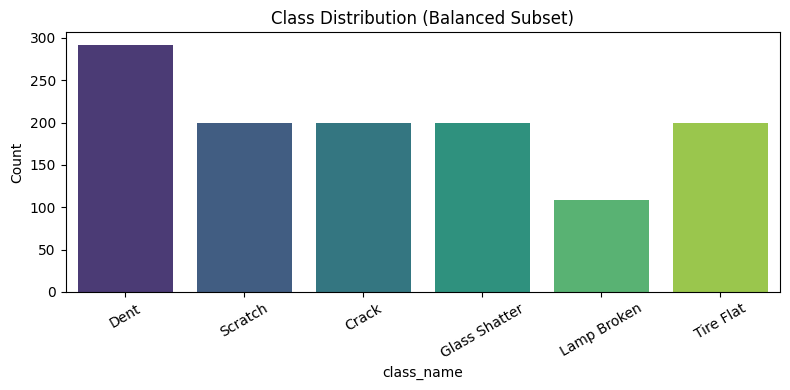

In [17]:
plt.figure(figsize=(8, 4))
sns.countplot(data=df_manifest, x='class_name', order=CFG.CLASSES, palette='viridis')
plt.title("Class Distribution (Balanced Subset)")
plt.xticks(rotation=30)
plt.ylabel("Count")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/class_distribution.png', dpi=150)
plt.show()


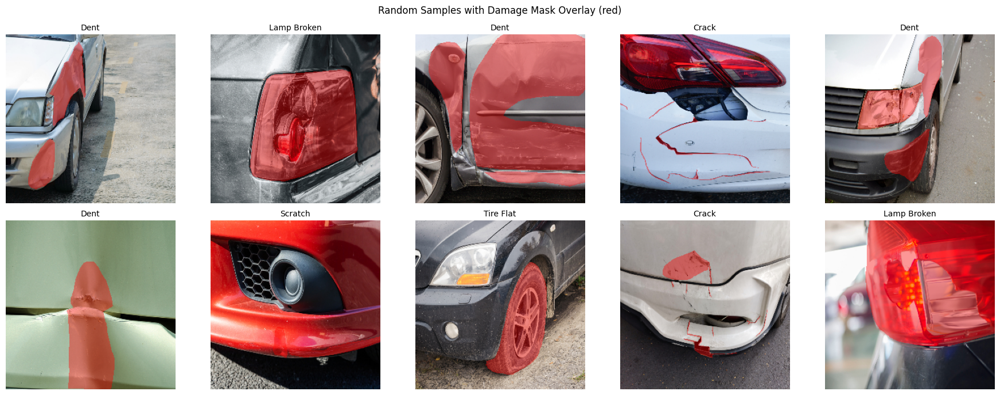

In [18]:
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
sample_rows = df_manifest.sample(10, random_state=SEED).reset_index(drop=True)

for i, ax in enumerate(axes.flat):
    row = sample_rows.iloc[i]
    img = cv2.imread(os.path.join(img_out_dir, row['file_name']))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(os.path.join(mask_out_dir, row['file_name']), cv2.IMREAD_GRAYSCALE)

    overlay = img.copy()
    overlay[mask > 127] = [255, 0, 0]
    blended = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)

    ax.imshow(blended)
    ax.set_title(row['class_name'], fontsize=10)
    ax.axis('off')

plt.suptitle("Random Samples with Damage Mask Overlay (red)")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/sample_images.png', dpi=150)
plt.show()


             width       height
count  1200.000000  1200.000000
mean    977.920000   704.701667
std      80.997515    96.135344
min     562.000000   453.000000
25%    1000.000000   667.000000
50%    1000.000000   667.000000
75%    1000.000000   750.000000
max    1000.000000  1000.000000


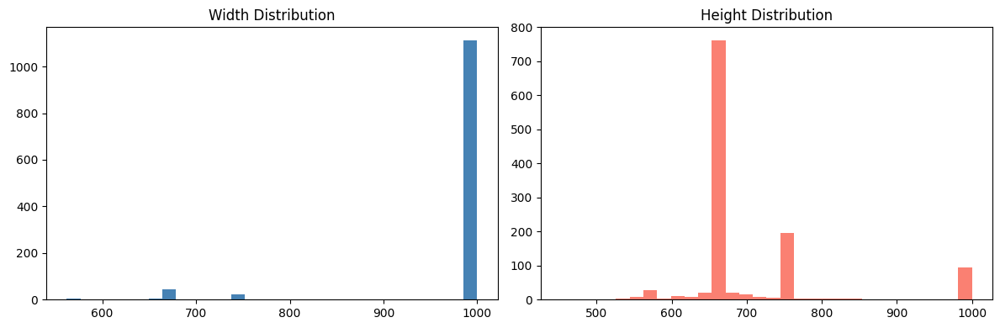

Average image size: 978 x 705


In [19]:
dims = []
for p in df_subset['path']:
    with Image.open(p) as im:
        dims.append(im.size)  # (width, height)

widths, heights = zip(*dims)
dim_df = pd.DataFrame({'width': widths, 'height': heights})
print(dim_df.describe())

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(widths, bins=30, color='steelblue')
axes[0].set_title("Width Distribution")
axes[1].hist(heights, bins=30, color='salmon')
axes[1].set_title("Height Distribution")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/resolution_distribution.png', dpi=150)
plt.show()

print(f"Average image size: {dim_df['width'].mean():.0f} x {dim_df['height'].mean():.0f}")


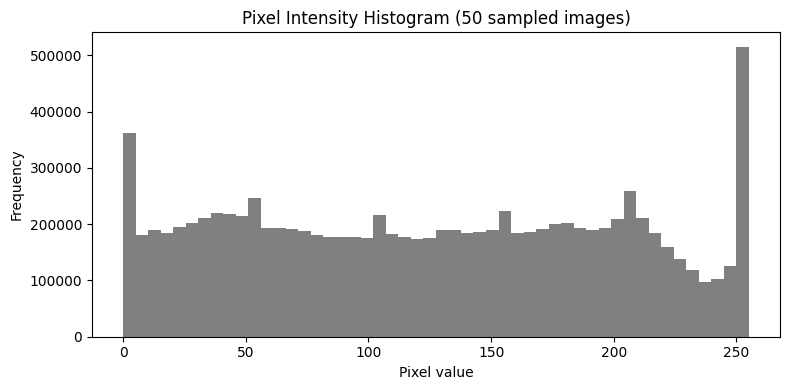

In [ ]:
# Pixel intensity histogram (sampled)
sample_pixels = []
for fn in df_manifest['file_name'].sample(50, random_state=SEED):
    img = cv2.imread(os.path.join(img_out_dir, fn))
    sample_pixels.append(img.flatten())
sample_pixels = np.concatenate(sample_pixels)

plt.figure(figsize=(8, 4))
plt.hist(sample_pixels, bins=50, color='gray')
plt.title("Pixel Intensity Histogram (50 sampled images)")
plt.xlabel("Pixel value")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/pixel_intensity_histogram.png', dpi=150)
plt.show()


In [20]:
# Class imbalance analysis
class_counts = df_manifest['class_name'].value_counts()
imbalance_ratio = class_counts.max() / class_counts.min()
print("Class counts:\n", class_counts)
print(f"\nImbalance ratio (max/min class count): {imbalance_ratio:.2f}")


Class counts:
 class_name
Dent             292
Scratch          200
Crack            200
Glass Shatter    200
Tire Flat        200
Lamp Broken      108
Name: count, dtype: int64

Imbalance ratio (max/min class count): 2.70


In [21]:
missing, corrupt = [], []
for fn in df_manifest['file_name']:
    p = os.path.join(img_out_dir, fn)
    if not os.path.exists(p):
        missing.append(fn)
        continue
    try:
        Image.open(p).verify()
    except Exception:
        corrupt.append(fn)

print(f"Missing files: {len(missing)}")
print(f"Corrupt files: {len(corrupt)}")


Missing files: 0
Corrupt files: 0


In [22]:
def average_hash(image_path, hash_size=8):
    img = Image.open(image_path).convert('L').resize((hash_size, hash_size))
    pixels = np.asarray(img)
    avg = pixels.mean()
    return tuple((pixels > avg).flatten())

hashes = {}
duplicates = []
for fn in tqdm(df_manifest['file_name'], desc="Hashing images"):
    h = average_hash(os.path.join(img_out_dir, fn))
    if h in hashes:
        duplicates.append((hashes[h], fn))
    else:
        hashes[h] = fn

print(f"Potential duplicate pairs found: {len(duplicates)}")
for d in duplicates[:5]:
    print("  ", d)


Hashing images:   0%|          | 0/1200 [00:00<?, ?it/s]

Potential duplicate pairs found: 1
   ('2777.png', '3942.png')


In [23]:
def apply_clahe(img_rgb):
    '''Contrast Limited Adaptive Histogram Equalization on the L channel of LAB space.'''
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_eq = clahe.apply(l)
    merged = cv2.merge((l_eq, a, b))
    return cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)

def apply_gaussian_blur(img_rgb, k=5):
    return cv2.GaussianBlur(img_rgb, (k, k), 0)

def apply_bilateral_filter(img_rgb):
    return cv2.bilateralFilter(img_rgb, d=9, sigmaColor=75, sigmaSpace=75)

def apply_histogram_equalization(img_rgb):
    ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0])
    return cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2RGB)

def apply_contrast_enhancement(img_rgb, alpha=1.3, beta=10):
    return cv2.convertScaleAbs(img_rgb, alpha=alpha, beta=beta)

def normalize_image(img_rgb):
    return img_rgb.astype(np.float32) / 255.0

def denoise_image(img_rgb):
    return cv2.fastNlMeansDenoisingColored(img_rgb, None, 7, 7, 7, 21)

print("Classical preprocessing functions defined: CLAHE, blur, bilateral filter,")
print("histogram equalization, contrast enhancement, normalization, denoising.")


Classical preprocessing functions defined: CLAHE, blur, bilateral filter,
histogram equalization, contrast enhancement, normalization, denoising.


In [24]:
# Data augmentation pipeline (paired image+mask transforms preserve alignment)
train_augmentation = A.Compose([
    A.RandomRotate90(p=0.3),
    A.Rotate(limit=25, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.RandomScale(scale_limit=0.15, p=0.3),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.4),
    A.RandomCrop(height=int(CFG.SEG_SIZE * 0.85), width=int(CFG.SEG_SIZE * 0.85), p=0.3),
    A.Resize(CFG.SEG_SIZE, CFG.SEG_SIZE),
])

print("Augmentation pipeline ready: rotation, flips, brightness/contrast,")
print("zoom (scale), shift, random crop -> all resized back to a consistent size.")


Augmentation pipeline ready: rotation, flips, brightness/contrast,
zoom (scale), shift, random crop -> all resized back to a consistent size.


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


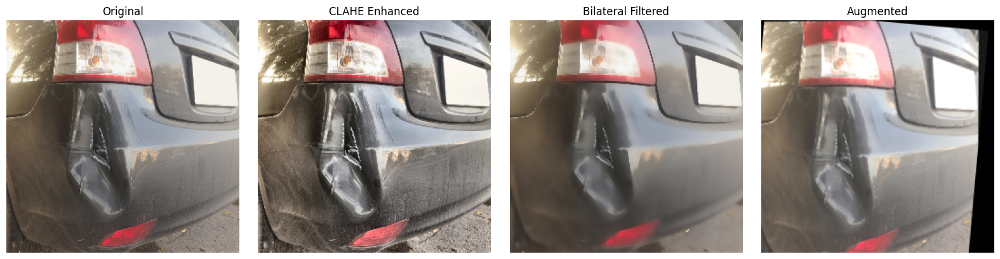

In [25]:
# Visualize BEFORE vs AFTER preprocessing/augmentation
sample_fn = df_manifest.iloc[0]['file_name']
img = cv2.cvtColor(cv2.imread(os.path.join(img_out_dir, sample_fn)), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(mask_out_dir, sample_fn), cv2.IMREAD_GRAYSCALE)

clahe_img = apply_clahe(img)
denoised_img = apply_bilateral_filter(img)
augmented = train_augmentation(image=img, mask=mask)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
titles = ['Original', 'CLAHE Enhanced', 'Bilateral Filtered', 'Augmented']
imgs_to_show = [img, clahe_img, denoised_img, augmented['image']]
for ax, title, im in zip(axes, titles, imgs_to_show):
    ax.imshow(im)
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/preprocessing_before_after.png', dpi=150)
plt.show()


In [26]:
# ---------------------------------------------------------------------------
# tf.data pipeline for segmentation (reads resized images + masks from disk)
# ---------------------------------------------------------------------------
def load_seg_sample(file_name):
    file_name = file_name.numpy().decode('utf-8')
    img = cv2.cvtColor(cv2.imread(os.path.join(img_out_dir, file_name)), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(os.path.join(mask_out_dir, file_name), cv2.IMREAD_GRAYSCALE)

    img = img.astype(np.float32) / 255.0
    mask = (mask > 127).astype(np.float32)[..., np.newaxis]
    return img, mask

def tf_load_seg_sample(file_name):
    img, mask = tf.py_function(load_seg_sample, [file_name], [tf.float32, tf.float32])
    img.set_shape([CFG.SEG_SIZE, CFG.SEG_SIZE, 3])
    mask.set_shape([CFG.SEG_SIZE, CFG.SEG_SIZE, 1])
    return img, mask

def make_seg_dataset(df, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices(df['file_name'].values)
    ds = ds.map(tf_load_seg_sample, num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(buffer_size=len(df), seed=SEED)
    ds = ds.batch(CFG.BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

seg_train_ds = make_seg_dataset(df_train, shuffle=True)
seg_val_ds   = make_seg_dataset(df_val)
seg_test_ds  = make_seg_dataset(df_test)
print("Segmentation tf.data pipelines ready.")


Segmentation tf.data pipelines ready.


In [27]:
# ---------------------------------------------------------------------------
# U-Net architecture: encoder, bottleneck, decoder with skip connections
# ---------------------------------------------------------------------------
def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

def build_unet(input_size=(CFG.SEG_SIZE, CFG.SEG_SIZE, 3)):
    inputs = layers.Input(shape=input_size)

    # ---- Encoder ----
    c1 = conv_block(inputs, 32); p1 = layers.MaxPooling2D()(c1)
    c2 = conv_block(p1, 64);     p2 = layers.MaxPooling2D()(c2)
    c3 = conv_block(p2, 128);    p3 = layers.MaxPooling2D()(c3)
    c4 = conv_block(p3, 256);    p4 = layers.MaxPooling2D()(c4)

    # ---- Bottleneck ----
    bn = conv_block(p4, 512)

    # ---- Decoder (with skip connections) ----
    u4 = layers.Conv2DTranspose(256, 2, strides=2, padding='same')(bn)
    u4 = layers.Concatenate()([u4, c4]); d4 = conv_block(u4, 256)

    u3 = layers.Conv2DTranspose(128, 2, strides=2, padding='same')(d4)
    u3 = layers.Concatenate()([u3, c3]); d3 = conv_block(u3, 128)

    u2 = layers.Conv2DTranspose(64, 2, strides=2, padding='same')(d3)
    u2 = layers.Concatenate()([u2, c2]); d2 = conv_block(u2, 64)

    u1 = layers.Conv2DTranspose(32, 2, strides=2, padding='same')(d2)
    u1 = layers.Concatenate()([u1, c1]); d1 = conv_block(u1, 32)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(d1)

    return models.Model(inputs, outputs, name='UNet')

unet_model = build_unet()
unet_model.summary()


Model: "UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_4[0][0]  

 Total params: 7,771,873 (29.65 MB)

 Trainable params: 7,765,985 (29.62 MB)

 Non-trainable params: 5,888 (23.00 KB)

In [28]:
# ---------------------------------------------------------------------------
# Segmentation metrics: Dice Coefficient, IoU, Pixel Accuracy
# ---------------------------------------------------------------------------
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(tf.cast(y_pred > 0.5, tf.float32), [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_metric(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(tf.cast(y_pred > 0.5, tf.float32), [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_mean(bce) + dice_loss(y_true, y_pred)

unet_model.compile(
    optimizer=optimizers.Adam(learning_rate=CFG.LR),
    loss=bce_dice_loss,
    metrics=[dice_coefficient, iou_metric, 'binary_accuracy']
)
print("U-Net compiled with BCE+Dice loss and Dice/IoU/pixel-accuracy metrics.")


U-Net compiled with BCE+Dice loss and Dice/IoU/pixel-accuracy metrics.


In [29]:
seg_callbacks = [
    callbacks.EarlyStopping(monitor='val_dice_coefficient', mode='max', patience=6, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6),
    callbacks.ModelCheckpoint(f'{CFG.MODEL_DIR}/unet_best.keras', monitor='val_dice_coefficient', mode='max', save_best_only=True),
    callbacks.TensorBoard(log_dir=f'{CFG.BASE_DIR}/tb_logs/unet'),
]

seg_history = unet_model.fit(
    seg_train_ds,
    validation_data=seg_val_ds,
    epochs=CFG.SEG_EPOCHS,
    callbacks=seg_callbacks
)

Epoch 1/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - binary_accuracy: 0.7205 - dice_coefficient: 0.3618 - iou_metric: 0.2249 - loss: 1.2156 - val_binary_accuracy: 0.3387 - val_dice_coefficient: 0.4258 - val_iou_metric: 0.2749 - val_loss: 1.4345 - learning_rate: 0.0010
Epoch 2/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 24s 398ms/step - binary_accuracy: 0.7706 - dice_coefficient: 0.4869 - iou_metric: 0.3251 - loss: 1.0039 - val_binary_accuracy: 0.4557 - val_dice_coefficient: 0.4617 - val_iou_metric: 0.3044 - val_loss: 1.2004 - learning_rate: 0.0010
Epoch 3/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 380ms/step - binary_accuracy: 0.7793 - dice_coefficient: 0.4985 - iou_metric: 0.3353 - loss: 0.9695 - val_binary_accuracy: 0.7665 - val_dice_coefficient: 0.4980 - val_iou_metric: 0.3339 - val_loss: 1.0591 - learning_rate: 0.0010
Epoch 4/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 23s 366ms/step - binary_accuracy: 0.7864 - dice_coefficient: 0.5172 - iou_metric: 0.3511 - loss: 0.9449 - val_binary_accuracy: 0.7605 - val_dice_coeffi

In [30]:
# ---------------------------------------------------------------------------
# Evaluate U-Net on the held-out test set
# ---------------------------------------------------------------------------
seg_test_results = unet_model.evaluate(seg_test_ds, return_dict=True)
print("U-Net Test Set Results:")
for k, v in seg_test_results.items():
    print(f"  {k}: {v:.4f}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 775ms/step - binary_accuracy: 0.7743 - dice_coefficient: 0.5732 - iou_metric: 0.4052 - loss: 0.9051
U-Net Test Set Results:
  binary_accuracy: 0.7743
  dice_coefficient: 0.5732
  iou_metric: 0.4052
  loss: 0.9051


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


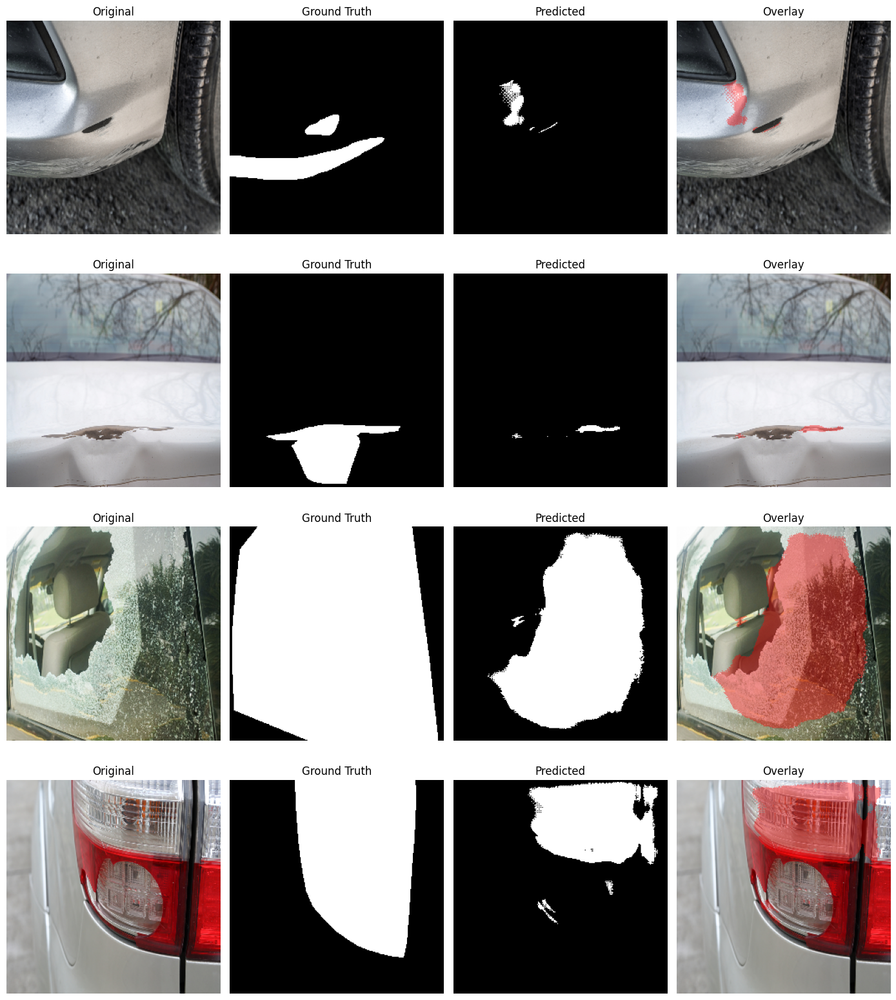

In [31]:
# ---------------------------------------------------------------------------
# Visualize: Original | Ground Truth Mask | Predicted Mask | Overlay
# ---------------------------------------------------------------------------
sample_batch_imgs, sample_batch_masks = next(iter(seg_test_ds))
preds = unet_model.predict(sample_batch_imgs)

n_show = 4
fig, axes = plt.subplots(n_show, 4, figsize=(14, 4 * n_show))
for i in range(n_show):
    img = sample_batch_imgs[i].numpy()
    gt_mask = sample_batch_masks[i].numpy().squeeze()
    pred_mask = (preds[i].squeeze() > 0.5).astype(np.uint8)

    overlay = img.copy()
    overlay[pred_mask == 1] = [1, 0, 0]
    blended = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)

    axes[i, 0].imshow(img); axes[i, 0].set_title("Original"); axes[i, 0].axis('off')
    axes[i, 1].imshow(gt_mask, cmap='gray'); axes[i, 1].set_title("Ground Truth"); axes[i, 1].axis('off')
    axes[i, 2].imshow(pred_mask, cmap='gray'); axes[i, 2].set_title("Predicted"); axes[i, 2].axis('off')
    axes[i, 3].imshow(blended); axes[i, 3].set_title("Overlay"); axes[i, 3].axis('off')

plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/segmentation_results.png', dpi=150)
plt.show()


In [42]:
def extract_roi(img_rgb, binary_mask, pad_ratio=0.1):
    '''Crop the bounding box around the largest connected mask component,
    with a small padding margin. Falls back to the full image if no mask found.'''
    ys, xs = np.where(binary_mask > 0)
    if len(xs) == 0:
        return img_rgb  # no damage detected -> return original image

    x1, x2, y1, y2 = xs.min(), xs.max(), ys.min(), ys.max()
    h, w = binary_mask.shape
    pad_x, pad_y = int((x2 - x1) * pad_ratio), int((y2 - y1) * pad_ratio)
    x1, x2 = max(0, x1 - pad_x), min(w, x2 + pad_x)
    y1, y2 = max(0, y1 - pad_y), min(h, y2 + pad_y)

    # Ensure the extracted region has positive dimensions
    if x2 <= x1 or y2 <= y1:
        return img_rgb  # Fallback to original image if ROI is degenerate

    return img_rgb[y1:y2, x1:x2]

In [43]:
# ---------------------------------------------------------------------------
# Pre-compute ROI crops for the ENTIRE dataset (train/val/test) using the
# trained U-Net, and save them to disk for the classifier stage (Part 7-9).
# ---------------------------------------------------------------------------
roi_dir = f'{CFG.DATA_DIR}/roi'
os.makedirs(roi_dir, exist_ok=True)

def precompute_rois(df, split_name):
    file_names = df['file_name'].values
    for i in tqdm(range(0, len(file_names), CFG.BATCH_SIZE), desc=f"ROI extraction ({split_name})"):
        batch_names = file_names[i:i + CFG.BATCH_SIZE]
        batch_imgs = []
        for fn in batch_names:
            img = cv2.cvtColor(cv2.imread(os.path.join(img_out_dir, fn)), cv2.COLOR_BGR2RGB)
            batch_imgs.append(cv2.resize(img, (CFG.SEG_SIZE, CFG.SEG_SIZE)).astype(np.float32) / 255.0)
        batch_imgs = np.stack(batch_imgs)
        batch_preds = unet_model.predict(batch_imgs, verbose=0)

        for fn, im, pm in zip(batch_names, batch_imgs, batch_preds):
            mask = (pm.squeeze() > 0.5).astype(np.uint8)
            roi = extract_roi((im * 255).astype(np.uint8), mask)
            roi_resized = cv2.resize(roi, (CFG.IMG_SIZE, CFG.IMG_SIZE))
            cv2.imwrite(os.path.join(roi_dir, fn), cv2.cvtColor(roi_resized, cv2.COLOR_RGB2BGR))

precompute_rois(df_train, 'train')
precompute_rois(df_val, 'val')
precompute_rois(df_test, 'test')
print("All ROI crops saved to", roi_dir)


ROI extraction (train):   0%|          | 0/53 [00:00<?, ?it/s]

ROI extraction (val):   0%|          | 0/12 [00:00<?, ?it/s]

ROI extraction (test):   0%|          | 0/12 [00:00<?, ?it/s]

All ROI crops saved to /content/cardd_project/data/roi


In [44]:
# ---------------------------------------------------------------------------
# Imports needed specifically for this module (safe to re-run even if
# already imported earlier in the notebook).
# ---------------------------------------------------------------------------
import os
import time
import json
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input

from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                              confusion_matrix, classification_report, roc_curve, auc,
                              precision_recall_curve)
from sklearn.preprocessing import label_binarize

print("TensorFlow:", tf.__version__)
print("Keras:", keras.__version__)
#Latest

TensorFlow: 2.20.0
Keras: 3.13.2


In [45]:
# ---------------------------------------------------------------------------
# Classifier-specific configuration (aliases onto the existing CFG so this
# module is self-documenting without duplicating global state)
# ---------------------------------------------------------------------------
IMG_SIZE      = CFG.IMG_SIZE            # 224
NUM_CLASSES   = CFG.N_CLASSES           # 6
CLASS_NAMES   = CFG.CLASSES
BATCH_SIZE    = CFG.BATCH_SIZE
CLASS_TO_IDX  = {c: i for i, c in enumerate(CLASS_NAMES)}

CLF_LOG_DIR   = f'{CFG.BASE_DIR}/tb_logs'
CLF_MODEL_DIR = CFG.MODEL_DIR
os.makedirs(CLF_LOG_DIR, exist_ok=True)
os.makedirs(CLF_MODEL_DIR, exist_ok=True)

print(f"IMG_SIZE={IMG_SIZE}  NUM_CLASSES={NUM_CLASSES}  CLASSES={CLASS_NAMES}")


IMG_SIZE=224  NUM_CLASSES=6  CLASSES=['Dent', 'Scratch', 'Crack', 'Glass Shatter', 'Lamp Broken', 'Tire Flat']


In [46]:
# ---------------------------------------------------------------------------
# tf.data pipeline: builds a dataset of (preprocessed_image, label) pairs
# from a manifest dataframe + a source folder (works for either the ROI
# crops or the original images — same folders produced by Parts 1-6).
# ---------------------------------------------------------------------------
def _load_image(file_name, label, source_dir):
    file_name = file_name.numpy().decode('utf-8')
    source_dir = source_dir.numpy().decode('utf-8')
    img = cv2.cvtColor(cv2.imread(os.path.join(source_dir, file_name)), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE)).astype(np.float32)
    return img, label

def _tf_load_image(file_name, label, source_dir):
    img, label = tf.py_function(_load_image, [file_name, label, source_dir], [tf.float32, tf.int32])
    img.set_shape([IMG_SIZE, IMG_SIZE, 3])
    label.set_shape([])
    return preprocess_input(img), label

def make_classification_dataset(df, source_dir, shuffle=False, batch_size=BATCH_SIZE):
    '''Build a tf.data.Dataset of (image, label) pairs from a manifest dataframe.'''
    labels = df['class_name'].map(CLASS_TO_IDX).values.astype(np.int32)
    ds = tf.data.Dataset.from_tensor_slices((df['file_name'].values, labels))
    ds = ds.map(lambda f, l: _tf_load_image(f, l, tf.constant(source_dir)),
                num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(buffer_size=len(df), seed=SEED)
    return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Primary datasets: trained on segmented ROI crops (this is our main "Model B")
train_ds_roi = make_classification_dataset(df_train, roi_dir, shuffle=True)
val_ds_roi   = make_classification_dataset(df_val, roi_dir)
test_ds_roi  = make_classification_dataset(df_test, roi_dir)
print("ROI-based classification datasets ready.")


ROI-based classification datasets ready.


In [47]:
# ---------------------------------------------------------------------------
# Class weighting -- compensates for remaining class imbalance (even after
# raising the sample size) by up-weighting under-represented classes in the
# training loss, so the model doesn't just default to predicting the most
# common class.
# ---------------------------------------------------------------------------
from sklearn.utils.class_weight import compute_class_weight

train_labels_numeric = df_train['class_name'].map(CLASS_TO_IDX).values
class_weight_array = compute_class_weight(
    class_weight='balanced',
    classes=np.arange(NUM_CLASSES),
    y=train_labels_numeric
)
class_weight_dict = {i: w for i, w in enumerate(class_weight_array)}
print("Class weights:", {CLASS_NAMES[i]: round(w, 2) for i, w in class_weight_dict.items()})


Class weights: {'Dent': np.float64(0.69), 'Scratch': np.float64(1.0), 'Crack': np.float64(1.0), 'Glass Shatter': np.float64(1.0), 'Lamp Broken': np.float64(1.86), 'Tire Flat': np.float64(1.0)}


In [48]:
def build_classifier(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    '''
    Build the damage classifier as ONE FLAT functional graph.

    Keras 3 / TF 2.19+ compatibility note:
    We deliberately do NOT wrap EfficientNetB0 as a nested sub-model called
    on a separate `Input` tensor (i.e. we avoid the `base_model(inputs)`
    pattern). Instead we extend the graph directly from `base_model.input`
    to `base_model.output` and onward through the custom head, in a single
    `Model(...)` call. This keeps every EfficientNet layer as a first-class,
    top-level layer of the final model, which is what makes
    `model.get_layer(name)` and Grad-CAM's gradient tape work without the
    `Functional.call()` / `KeyError` issues caused by nested Functional
    sub-graphs in Keras 3.

    Returns
    -------
    model      : the full classifier (Model)
    base_model : handle to the EfficientNetB0 layers (Model) for freeze/
                 unfreeze control — its layers ARE model's layers (same
                 underlying objects), since the graph was built by walking
                 base_model's own output tensor.
    '''
    base_model = EfficientNetB0(include_top=False, weights="imagenet", input_shape=input_shape)

    x = base_model.output
    x = layers.GlobalAveragePooling2D(name="gap")(x)
    x = layers.BatchNormalization(name="head_bn")(x)
    x = layers.Dense(512, activation="relu", name="fc_512")(x)
    x = layers.Dropout(0.4, name="drop_512")(x)
    x = layers.Dense(256, activation="relu", name="fc_256")(x)
    x = layers.Dropout(0.3, name="drop_256")(x)
    x = layers.Dense(128, activation="relu", name="fc_128")(x)
    x = layers.Dropout(0.2, name="drop_128")(x)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(x)

    model = models.Model(inputs=base_model.input, outputs=outputs,
                          name="EfficientNetB0_DamageClassifier")
    return model, base_model


def configure_trainable_layers(base_model, num_layers_to_unfreeze):
    '''Freeze every EfficientNet layer, then unfreeze only the last
    `num_layers_to_unfreeze` layers. `num_layers_to_unfreeze=0` freezes all.'''
    base_model.trainable = True  # unlock the container first...
    n = len(base_model.layers)
    for i, layer in enumerate(base_model.layers):
        layer.trainable = (i >= n - num_layers_to_unfreeze) if num_layers_to_unfreeze > 0 else False
    trainable_count = sum(l.trainable for l in base_model.layers)
    print(f"EfficientNet layers trainable: {trainable_count}/{n}")


def find_last_conv_layer_name(model, min_rank=4):
    '''Auto-detect the last convolutional/feature-map layer (rank-4 output)
    in the model — used as the Grad-CAM target layer. Works regardless of
    exact EfficientNet layer names across TF/Keras versions.'''
    for layer in reversed(model.layers):
        try:
            if len(layer.output.shape) == min_rank:
                return layer.name
        except AttributeError:
            continue
    raise ValueError("No rank-4 (conv-like) layer found in model.")

print("build_classifier(), configure_trainable_layers(), find_last_conv_layer_name() ready.")


build_classifier(), configure_trainable_layers(), find_last_conv_layer_name() ready.


In [49]:
def get_callbacks(stage_name, monitor='val_accuracy', mode='max', patience=6):
    '''Build a standard callback set for a given training stage, with
    stage-specific checkpoint/log paths so stages never overwrite each other.'''
    stage_dir = f'{CLF_MODEL_DIR}/{stage_name}'
    os.makedirs(stage_dir, exist_ok=True)

    return [
        callbacks.EarlyStopping(monitor=monitor, mode=mode, patience=patience, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8),
        callbacks.ModelCheckpoint(f'{stage_dir}/best.keras', monitor=monitor, mode=mode, save_best_only=True),
        callbacks.CSVLogger(f'{stage_dir}/training_log.csv'),
        callbacks.TensorBoard(log_dir=f'{CLF_LOG_DIR}/{stage_name}'),
    ]

print("get_callbacks() ready — used identically across all 3 training stages.")


get_callbacks() ready — used identically across all 3 training stages.


In [50]:
# ---------------------------------------------------------------------------
# Build the model once; all three stages reuse the SAME model object so
# weights carry over between stages (this is standard progressive fine-tuning).
# ---------------------------------------------------------------------------
clf_model, clf_base = build_classifier()
clf_model.summary()


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "EfficientNetB0_DamageClassifier"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,875,561 (18.60 MB)

 Trainable params: 4,830,978 (18.43 MB)

 Non-trainable params: 44,583 (174.16 KB)

In [51]:
# ---------------------------------------------------------------------------
# STAGE 1 — train the custom head, EfficientNet fully frozen
# ---------------------------------------------------------------------------
configure_trainable_layers(clf_base, num_layers_to_unfreeze=0)

clf_model.compile(optimizer=optimizers.Adam(learning_rate=1e-3),
                   loss='sparse_categorical_crossentropy',
                   metrics=['accuracy'])

history_stage1 = clf_model.fit(
    train_ds_roi, validation_data=val_ds_roi,
    epochs=CFG.CLF_EPOCHS,
    class_weight=class_weight_dict,
    callbacks=get_callbacks('stage1_frozen')
)


EfficientNet layers trainable: 0/238
Epoch 1/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 74s 793ms/step - accuracy: 0.4470 - loss: 1.4196 - val_accuracy: 0.5833 - val_loss: 1.1451 - learning_rate: 0.0010
Epoch 2/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.5816 - loss: 1.0836 - val_accuracy: 0.6222 - val_loss: 1.0244 - learning_rate: 0.0010
Epoch 3/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.6806 - loss: 0.8545 - val_accuracy: 0.6333 - val_loss: 0.9004 - learning_rate: 0.0010
Epoch 4/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7151 - loss: 0.6961 - val_accuracy: 0.6056 - val_loss: 0.9532 - learning_rate: 0.0010
Epoch 5/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.7795 - loss: 0.5871 - val_accuracy: 0.6500 - val_loss: 0.9833 - learning_rate: 0.0010
Epoch 6/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.7867 - loss: 0.5652 - val_accuracy: 0.6222 - val_loss: 0.9885 - learning_rate: 0.0010
Epoch 7/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - ac

In [52]:
# ---------------------------------------------------------------------------
# STAGE 2 — unfreeze the last 30 EfficientNet layers
# ---------------------------------------------------------------------------
configure_trainable_layers(clf_base, num_layers_to_unfreeze=30)

clf_model.compile(optimizer=optimizers.Adam(learning_rate=1e-4),
                   loss='sparse_categorical_crossentropy',
                   metrics=['accuracy'])

history_stage2 = clf_model.fit(
    train_ds_roi, validation_data=val_ds_roi,
    epochs=CFG.FT_EPOCHS,
    class_weight=class_weight_dict,
    callbacks=get_callbacks('stage2_unfreeze30')
)


EfficientNet layers trainable: 30/238
Epoch 1/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 65s 619ms/step - accuracy: 0.7163 - loss: 0.7288 - val_accuracy: 0.6389 - val_loss: 1.0412 - learning_rate: 1.0000e-04
Epoch 2/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - accuracy: 0.7759 - loss: 0.5535 - val_accuracy: 0.6556 - val_loss: 1.0624 - learning_rate: 1.0000e-04
Epoch 3/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.8069 - loss: 0.4787 - val_accuracy: 0.6222 - val_loss: 1.0612 - learning_rate: 1.0000e-04
Epoch 4/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.8296 - loss: 0.4145 - val_accuracy: 0.6389 - val_loss: 1.0958 - learning_rate: 1.0000e-04
Epoch 5/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8737 - loss: 0.3152 - val_accuracy: 0.6611 - val_loss: 1.1203 - learning_rate: 5.0000e-05
Epoch 6/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.8749 - loss: 0.3107 - val_accuracy: 0.6611 - val_loss: 1.1242 - learning_rate: 5.0000e-05
Epoch 7/15
53/53 ━━━━━━━━━━━━━

In [53]:
# ---------------------------------------------------------------------------
# STAGE 3 — unfreeze the last 80 EfficientNet layers, fine-tune at LR = 1e-5
# ---------------------------------------------------------------------------
configure_trainable_layers(clf_base, num_layers_to_unfreeze=80)

clf_model.compile(optimizer=optimizers.Adam(learning_rate=1e-5),
                   loss='sparse_categorical_crossentropy',
                   metrics=['accuracy'])

history_stage3 = clf_model.fit(
    train_ds_roi, validation_data=val_ds_roi,
    epochs=CFG.FT_EPOCHS,
    class_weight=class_weight_dict,
    callbacks=get_callbacks('stage3_unfreeze80')
)


EfficientNet layers trainable: 80/238
Epoch 1/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 86s 766ms/step - accuracy: 0.8331 - loss: 0.4377 - val_accuracy: 0.6500 - val_loss: 1.1528 - learning_rate: 1.0000e-05
Epoch 2/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - accuracy: 0.8200 - loss: 0.4205 - val_accuracy: 0.6833 - val_loss: 1.1305 - learning_rate: 1.0000e-05
Epoch 3/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - accuracy: 0.8522 - loss: 0.3842 - val_accuracy: 0.6778 - val_loss: 1.1022 - learning_rate: 1.0000e-05
Epoch 4/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - accuracy: 0.8534 - loss: 0.3990 - val_accuracy: 0.6722 - val_loss: 1.0835 - learning_rate: 1.0000e-05
Epoch 5/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.8296 - loss: 0.4017 - val_accuracy: 0.6667 - val_loss: 1.0716 - learning_rate: 1.0000e-05
Epoch 6/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.8510 - loss: 0.4022 - val_accuracy: 0.6611 - val_loss: 1.0624 - learning_rate: 1.0000e-05
Epoch 7/15
53/53 ━━━━━━━━━━━━━

In [75]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
import numpy as np
import cv2

# ---------------------------------------------------------------------------
# Grad-CAM implementation
# ---------------------------------------------------------------------------
LAST_CONV_LAYER_NAME = find_last_conv_layer_name(clf_model)
print("Grad-CAM target layer:", LAST_CONV_LAYER_NAME)

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    '''Standard Grad-CAM: builds a two-output model (conv features + final
    predictions) from the SAME flat graph, and differentiates the target
    class score w.r.t. the conv feature map.'''
    grad_model = models.Model(
        inputs=model.input,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array, training=False)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)

    # Fix: Safely get the Python integer value for pred_index
    final_pred_index = pred_index.numpy() if hasattr(pred_index, 'numpy') else pred_index
    return heatmap.numpy(), int(final_pred_index)


def overlay_heatmap(img_rgb_uint8, heatmap, alpha=0.4):
    '''Resize + colorize a Grad-CAM heatmap and blend it over the original image.'''
    heatmap_resized = cv2.resize(heatmap, (img_rgb_uint8.shape[1], img_rgb_uint8.shape[0]))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(img_rgb_uint8, 1 - alpha, heatmap_color, alpha, 0)


def deprocess_for_display(preprocessed_img):
    '''Undo EfficientNet's preprocess_input scaling, purely for visualization.'''
    img = preprocessed_img.numpy() if hasattr(preprocessed_img, 'numpy') else preprocessed_img
    img = img - img.min()
    img = img / (img.max() + 1e-8) * 255.0
    return img.astype(np.uint8)

print("Grad-CAM functions ready (make_gradcam_heatmap, overlay_heatmap).")

Grad-CAM target layer: top_activation
Grad-CAM functions ready (make_gradcam_heatmap, overlay_heatmap).


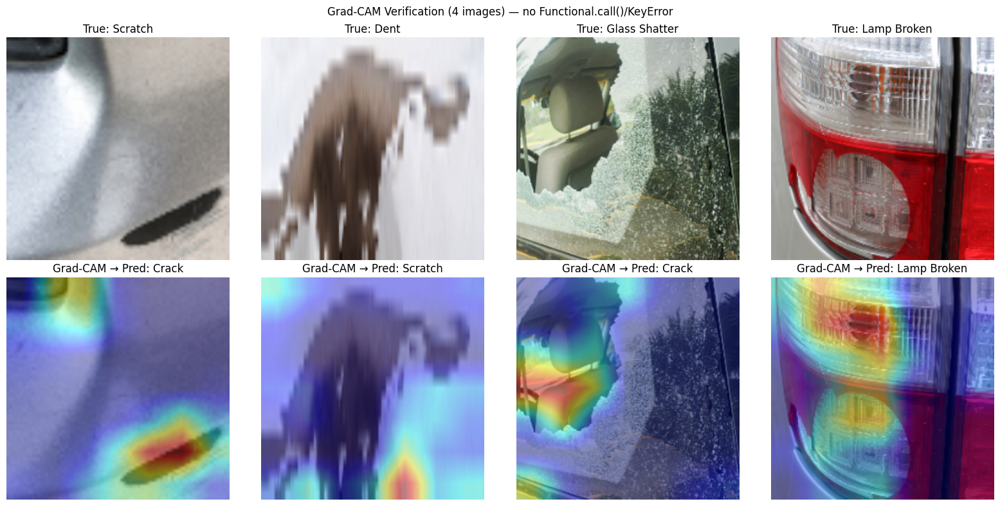

✓ Grad-CAM executed successfully on 4 images with the rewritten classifier.


In [55]:
# ---------------------------------------------------------------------------
# Verification: generate Grad-CAM on 4 test images
# ---------------------------------------------------------------------------
verify_imgs, verify_labels = next(iter(test_ds_roi))
n_verify = 4

fig, axes = plt.subplots(2, n_verify, figsize=(4 * n_verify, 8))
for i in range(n_verify):
    img_batch = tf.expand_dims(verify_imgs[i], 0)
    heatmap, pred_idx = make_gradcam_heatmap(img_batch, clf_model, LAST_CONV_LAYER_NAME)

    display_img = deprocess_for_display(verify_imgs[i])
    overlay = overlay_heatmap(display_img, heatmap)

    axes[0, i].imshow(display_img)
    axes[0, i].set_title(f"True: {CLASS_NAMES[verify_labels[i].numpy()]}")
    axes[0, i].axis('off')

    axes[1, i].imshow(overlay)
    axes[1, i].set_title(f"Grad-CAM → Pred: {CLASS_NAMES[pred_idx]}")
    axes[1, i].axis('off')

plt.suptitle("Grad-CAM Verification (4 images) — no Functional.call()/KeyError")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/gradcam_verification.png', dpi=150)
plt.show()
print("✓ Grad-CAM executed successfully on 4 images with the rewritten classifier.")


In [56]:
# ---------------------------------------------------------------------------
# Collect predictions on the held-out test set once, reused by every metric below
# ---------------------------------------------------------------------------
y_true, y_pred_probs, all_test_imgs = [], [], []
for imgs, labels in test_ds_roi:
    probs = clf_model.predict(imgs, verbose=0)
    y_pred_probs.append(probs)
    y_true.append(labels.numpy())
    all_test_imgs.append(imgs.numpy())

y_true = np.concatenate(y_true)
y_pred_probs = np.concatenate(y_pred_probs)
all_test_imgs = np.concatenate(all_test_imgs)
y_pred = np.argmax(y_pred_probs, axis=1)

acc = accuracy_score(y_true, y_pred)
prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
rec = recall_score(y_true, y_pred, average='macro', zero_division=0)
f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)

print(f"Accuracy : {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall   : {rec:.4f}")
print(f"F1 Score : {f1:.4f}")


Accuracy : 0.6685
Precision: 0.6830
Recall   : 0.6886
F1 Score : 0.6854


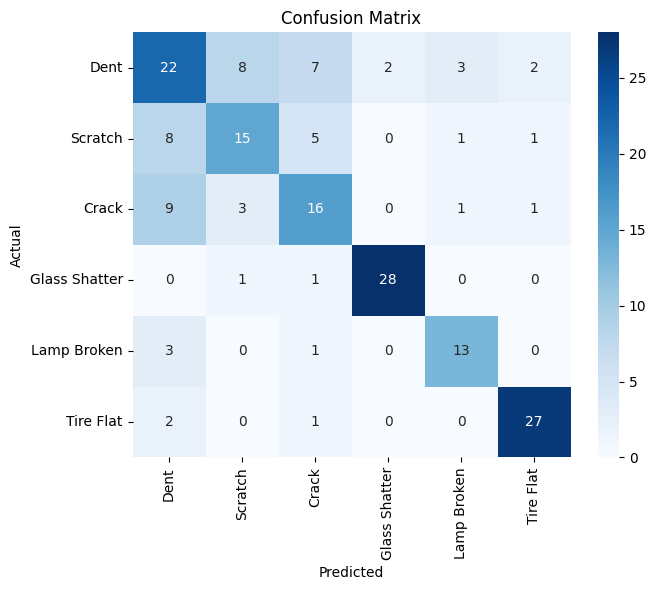

               precision    recall  f1-score   support

         Dent       0.50      0.50      0.50        44
      Scratch       0.56      0.50      0.53        30
        Crack       0.52      0.53      0.52        30
Glass Shatter       0.93      0.93      0.93        30
  Lamp Broken       0.72      0.76      0.74        17
    Tire Flat       0.87      0.90      0.89        30

     accuracy                           0.67       181
    macro avg       0.68      0.69      0.69       181
 weighted avg       0.67      0.67      0.67       181



In [57]:
# Confusion Matrix + Classification Report
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.xlabel("Predicted"); plt.ylabel("Actual"); plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/confusion_matrix_v2.png', dpi=150)
plt.show()

print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))


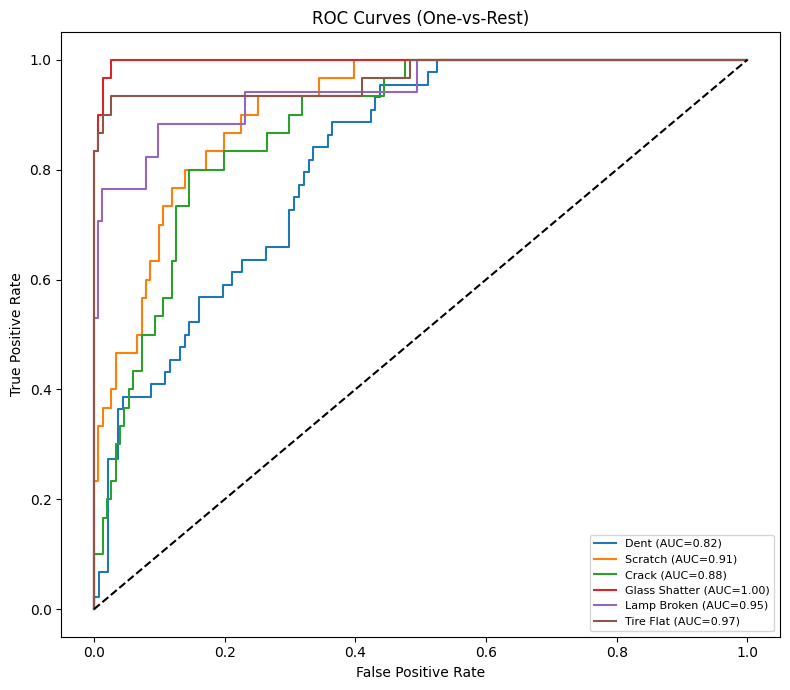

In [58]:
# ROC Curves + AUC (One-vs-Rest)
y_true_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))

plt.figure(figsize=(8, 7))
for i, cls in enumerate(CLASS_NAMES):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{cls} (AUC={roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC Curves (One-vs-Rest)"); plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/roc_curves_v2.png', dpi=150)
plt.show()


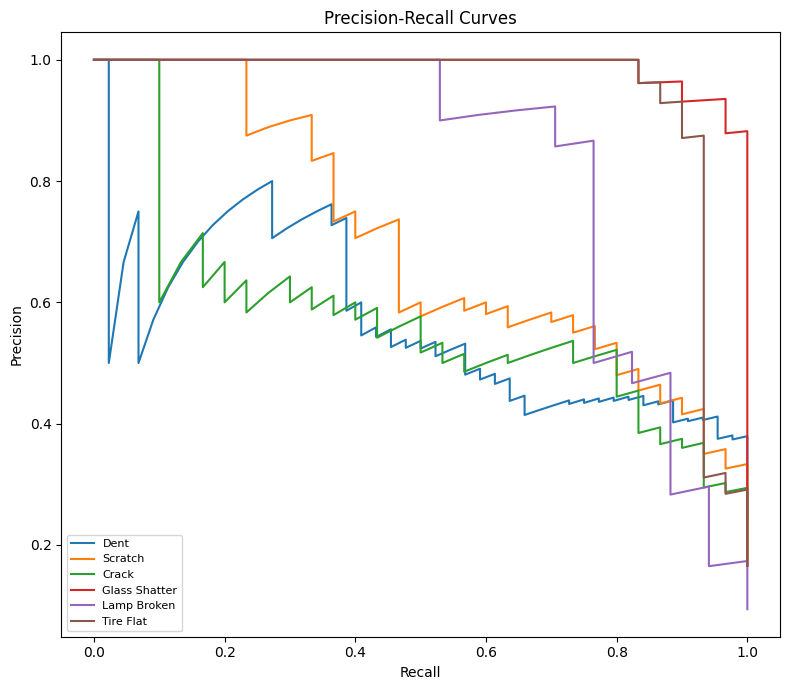

In [59]:
# Precision-Recall Curves
plt.figure(figsize=(8, 7))
for i, cls in enumerate(CLASS_NAMES):
    p, r, _ = precision_recall_curve(y_true_bin[:, i], y_pred_probs[:, i])
    plt.plot(r, p, label=cls)
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title("Precision-Recall Curves"); plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/pr_curves_v2.png', dpi=150)
plt.show()


               accuracy
Dent           0.500000
Scratch        0.500000
Crack          0.533333
Glass Shatter  0.933333
Lamp Broken    0.764706
Tire Flat      0.900000


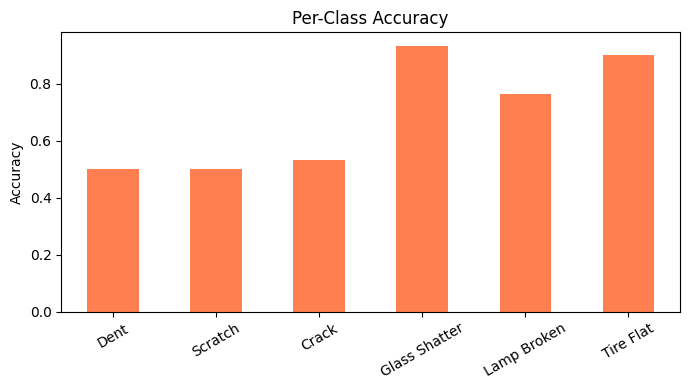

In [60]:
# Per-Class Accuracy
per_class_acc = {}
for i, cls in enumerate(CLASS_NAMES):
    idx = y_true == i
    per_class_acc[cls] = accuracy_score(y_true[idx], y_pred[idx]) if idx.sum() > 0 else float('nan')

per_class_df = pd.DataFrame.from_dict(per_class_acc, orient='index', columns=['accuracy'])
print(per_class_df)
per_class_df.plot(kind='bar', legend=False, figsize=(7, 4), color='coral')
plt.title("Per-Class Accuracy"); plt.ylabel("Accuracy"); plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/per_class_accuracy_v2.png', dpi=150)
plt.show()


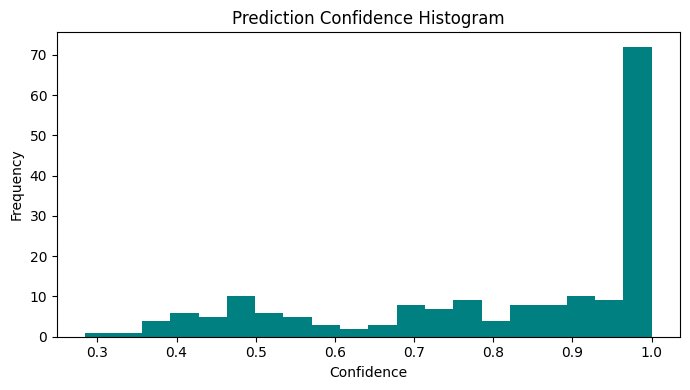

In [61]:
# Confidence Histogram
confidences = y_pred_probs.max(axis=1)
plt.figure(figsize=(7, 4))
plt.hist(confidences, bins=20, color='teal')
plt.title("Prediction Confidence Histogram"); plt.xlabel("Confidence"); plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/confidence_histogram_v2.png', dpi=150)
plt.show()


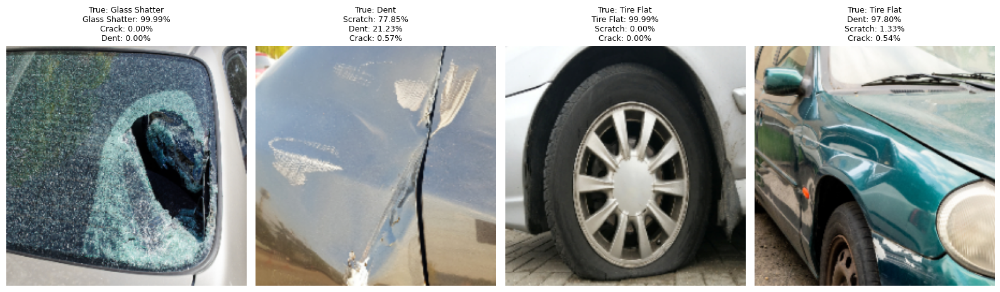

In [62]:
# Top-3 Predictions (displayed for a handful of test images)
def show_top3_predictions(n_samples=4):
    idxs = np.random.choice(len(all_test_imgs), n_samples, replace=False)
    fig, axes = plt.subplots(1, n_samples, figsize=(4 * n_samples, 4.5))
    for ax, idx in zip(axes, idxs):
        probs = y_pred_probs[idx]
        top3_idx = np.argsort(probs)[-3:][::-1]
        top3_text = "\n".join(f"{CLASS_NAMES[i]}: {probs[i]:.2%}" for i in top3_idx)

        disp = deprocess_for_display(all_test_imgs[idx])
        ax.imshow(disp)
        ax.set_title(f"True: {CLASS_NAMES[y_true[idx]]}\n{top3_text}", fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(f'{CFG.REPORT_DIR}/top3_predictions.png', dpi=150)
    plt.show()

show_top3_predictions()


Misclassified: 60 / 181


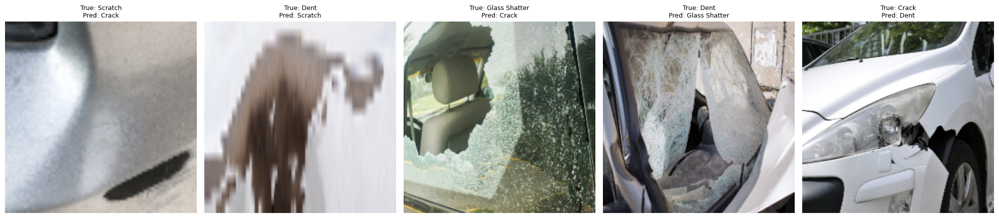

In [63]:
# Misclassified Image Analysis
misclassified_idx = np.where(y_true != y_pred)[0]
print(f"Misclassified: {len(misclassified_idx)} / {len(y_true)}")

if len(misclassified_idx) > 0:
    n_show = min(5, len(misclassified_idx))
    fig, axes = plt.subplots(1, n_show, figsize=(4 * n_show, 4.5))
    if n_show == 1:
        axes = [axes]
    for ax, idx in zip(axes, misclassified_idx[:n_show]):
        disp = deprocess_for_display(all_test_imgs[idx])
        ax.imshow(disp)
        ax.set_title(f"True: {CLASS_NAMES[y_true[idx]]}\nPred: {CLASS_NAMES[y_pred[idx]]}", fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(f'{CFG.REPORT_DIR}/misclassified_v2.png', dpi=150)
    plt.show()


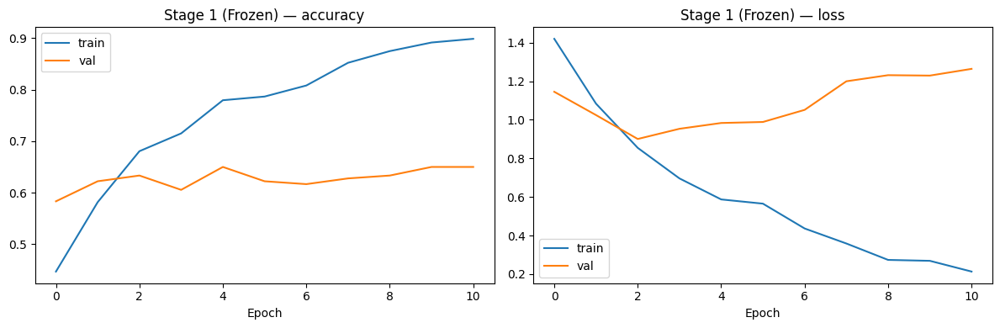

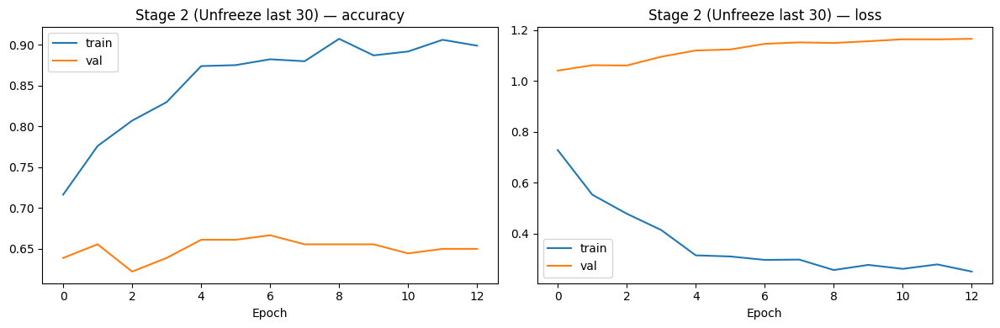

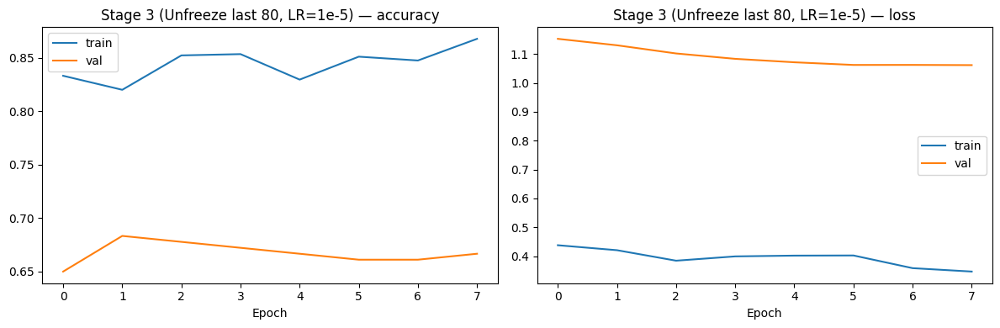

In [64]:
# Learning Curves across all three training stages
def plot_stage_history(history, stage_title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    for ax, key in zip(axes, ['accuracy', 'loss']):
        ax.plot(history.history[key], label='train')
        ax.plot(history.history[f'val_{key}'], label='val')
        ax.set_title(f"{stage_title} — {key}")
        ax.set_xlabel("Epoch"); ax.legend()
    plt.tight_layout()
    plt.show()

plot_stage_history(history_stage1, "Stage 1 (Frozen)")
plot_stage_history(history_stage2, "Stage 2 (Unfreeze last 30)")
plot_stage_history(history_stage3, "Stage 3 (Unfreeze last 80, LR=1e-5)")


In [65]:
# Top-1 and Top-3 Accuracy (kept from the original evaluation section)
top1 = tf.keras.metrics.sparse_top_k_categorical_accuracy(y_true, y_pred_probs, k=1).numpy().mean()
top3 = tf.keras.metrics.sparse_top_k_categorical_accuracy(y_true, y_pred_probs, k=3).numpy().mean()
print(f"Top-1 Accuracy: {top1:.4f}")
print(f"Top-3 Accuracy: {top3:.4f}")


Top-1 Accuracy: 0.6685
Top-3 Accuracy: 0.9448


In [66]:
# Model A: identical architecture/training recipe, trained on ORIGINAL (non-ROI) images
train_ds_orig = make_classification_dataset(df_train, img_out_dir, shuffle=True)
val_ds_orig   = make_classification_dataset(df_val, img_out_dir)
test_ds_orig  = make_classification_dataset(df_test, img_out_dir)

model_a, base_a = build_classifier()
configure_trainable_layers(base_a, num_layers_to_unfreeze=0)
model_a.compile(optimizer=optimizers.Adam(learning_rate=1e-3),
                loss='sparse_categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
model_a.fit(train_ds_orig, validation_data=val_ds_orig, epochs=CFG.CLF_EPOCHS,
            class_weight=class_weight_dict,
            callbacks=get_callbacks('model_a_original'))
train_time_a = time.time() - t0
print(f"Model A training time: {train_time_a:.1f}s")


EfficientNet layers trainable: 0/238
Epoch 1/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 55s 540ms/step - accuracy: 0.4470 - loss: 1.4274 - val_accuracy: 0.5611 - val_loss: 1.1393 - learning_rate: 0.0010
Epoch 2/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6293 - loss: 0.9500 - val_accuracy: 0.6222 - val_loss: 0.9895 - learning_rate: 0.0010
Epoch 3/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.6710 - loss: 0.7578 - val_accuracy: 0.6111 - val_loss: 0.9196 - learning_rate: 0.0010
Epoch 4/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7044 - loss: 0.7330 - val_accuracy: 0.5889 - val_loss: 1.0037 - learning_rate: 0.0010
Epoch 5/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - accuracy: 0.7342 - loss: 0.6182 - val_accuracy: 0.6278 - val_loss: 0.9762 - learning_rate: 0.0010
Epoch 6/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - accuracy: 0.7926 - loss: 0.4821 - val_accuracy: 0.6278 - val_loss: 1.1036 - learning_rate: 0.0010
Epoch 7/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - ac

                           accuracy  precision    recall        f1  \
Model A (Original Images)  0.712707   0.714280  0.721687  0.716701   
Model B (Segmented ROI)    0.668508   0.683035  0.688562  0.685390   

                           inference_time_per_batch_sec  training_time_sec  
Model A (Original Images)                      1.620385         115.696228  
Model B (Segmented ROI)                             NaN                NaN  


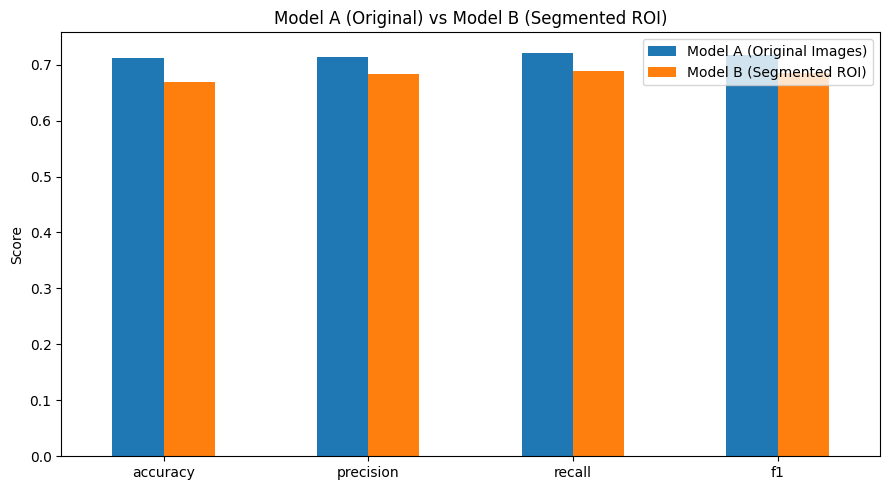

In [67]:
def evaluate_model(model, dataset):
    y_t, y_p = [], []
    t0 = time.time()
    n_batches = 0
    for imgs, labels in dataset:
        probs = model.predict(imgs, verbose=0)
        y_p.append(probs); y_t.append(labels.numpy())
        n_batches += 1
    infer_time = (time.time() - t0) / max(1, n_batches)
    y_t, y_p = np.concatenate(y_t), np.concatenate(y_p)
    preds = np.argmax(y_p, axis=1)
    return {
        'accuracy': accuracy_score(y_t, preds),
        'precision': precision_score(y_t, preds, average='macro', zero_division=0),
        'recall': recall_score(y_t, preds, average='macro', zero_division=0),
        'f1': f1_score(y_t, preds, average='macro', zero_division=0),
        'inference_time_per_batch_sec': infer_time,
    }

results_a = evaluate_model(model_a, test_ds_orig)
results_a['training_time_sec'] = train_time_a
results_b = {'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1, 'training_time_sec': None}

comparison_df = pd.DataFrame({'Model A (Original Images)': results_a,
                               'Model B (Segmented ROI)': results_b}).T
print(comparison_df)
comparison_df.to_csv(f'{CFG.REPORT_DIR}/model_comparison_v2.csv')

comparison_df[['accuracy', 'precision', 'recall', 'f1']].T.plot(kind='bar', figsize=(9, 5))
plt.title("Model A (Original) vs Model B (Segmented ROI)"); plt.ylabel("Score"); plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/model_comparison_chart_v2.png', dpi=150)
plt.show()


In [68]:
def predict_vehicle_damage(image_path, show_plot=True):
    '''Full inference pipeline for a single new image. Reuses the UNCHANGED
    `unet_model` and `extract_roi()` from Parts 5-6, and the rewritten
    classifier + Grad-CAM from this module.'''
    # 1. Preprocess
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    img_seg_input = cv2.resize(img, (CFG.SEG_SIZE, CFG.SEG_SIZE)).astype(np.float32) / 255.0

    # 2. Segment (U-Net — unchanged)
    mask_pred = unet_model.predict(np.expand_dims(img_seg_input, 0), verbose=0)[0]
    binary_mask = (mask_pred.squeeze() > 0.5).astype(np.uint8)

    # 3. Extract ROI (unchanged)
    roi = extract_roi((img_seg_input * 255).astype(np.uint8), binary_mask)
    roi_resized = cv2.resize(roi, (IMG_SIZE, IMG_SIZE))
    clf_input = preprocess_input(roi_resized.astype(np.float32))

    # 4. Classify (new flat model)
    probs = clf_model.predict(np.expand_dims(clf_input, 0), verbose=0)[0]
    pred_class_idx = int(np.argmax(probs))
    pred_class = CLASS_NAMES[pred_class_idx]
    confidence = float(probs[pred_class_idx])

    # 5. Grad-CAM (fixed)
    heatmap, _ = make_gradcam_heatmap(np.expand_dims(clf_input, 0), clf_model, LAST_CONV_LAYER_NAME, pred_index=pred_class_idx)
    gradcam_overlay = overlay_heatmap(roi_resized, heatmap)

    if show_plot:
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        axes[0].imshow(img); axes[0].set_title("Original"); axes[0].axis('off')
        axes[1].imshow(binary_mask, cmap='gray'); axes[1].set_title("Predicted Mask"); axes[1].axis('off')
        axes[2].imshow(roi_resized); axes[2].set_title("Extracted ROI"); axes[2].axis('off')
        axes[3].imshow(gradcam_overlay); axes[3].set_title("Grad-CAM"); axes[3].axis('off')
        plt.suptitle(f"Prediction: {pred_class} (confidence: {confidence:.2%})")
        plt.tight_layout()
        plt.show()

    return {'class': pred_class, 'confidence': confidence,
            'all_probs': dict(zip(CLASS_NAMES, probs.tolist()))}

print("predict_vehicle_damage() ready — segmentation/ROI stages unchanged, classifier+Grad-CAM fixed.")


predict_vehicle_damage() ready — segmentation/ROI stages unchanged, classifier+Grad-CAM fixed.


In [69]:
clf_model.save(f'{CLF_MODEL_DIR}/efficientnet_classifier_v2.keras')
model_a.save(f'{CLF_MODEL_DIR}/model_a_original_v2.keras')

for name, hist in [('stage1', history_stage1), ('stage2', history_stage2), ('stage3', history_stage3)]:
    with open(f'{CLF_MODEL_DIR}/history_{name}.json', 'w') as f:
        json.dump(hist.history, f)

print("Rewritten classifier, Model A, and all stage histories saved to", CLF_MODEL_DIR)


Rewritten classifier, Model A, and all stage histories saved to /content/cardd_project/models


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


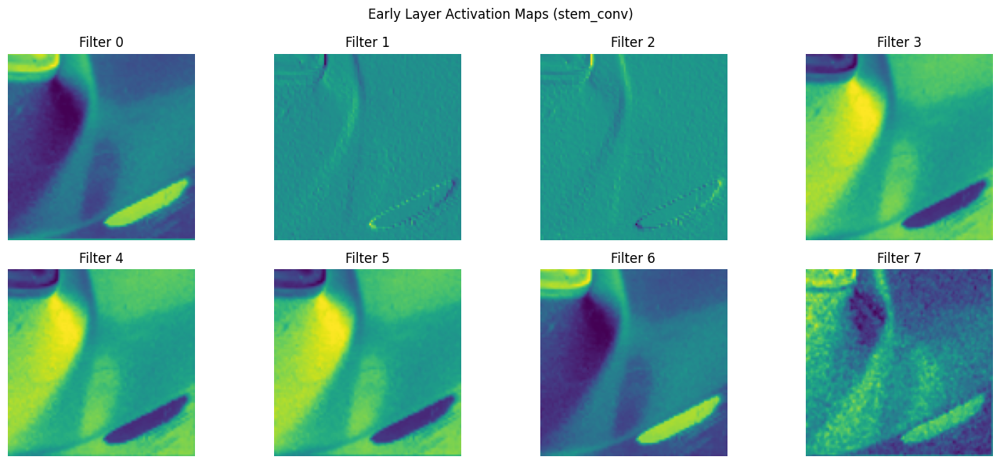

In [70]:
# Visualize raw feature/activation maps from an EARLY layer of the base model
early_layer_name = [l.name for l in clf_base.layers if isinstance(l, layers.Conv2D)][0]
activation_model = models.Model(inputs=clf_base.input, outputs=clf_base.get_layer(early_layer_name).output)

sample_img = tf.expand_dims(verify_imgs[0], 0)  # reuses the batch pulled for Grad-CAM verification
activations = activation_model.predict(sample_img)

fig, axes = plt.subplots(2, 4, figsize=(14, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(activations[0, :, :, i], cmap='viridis')
    ax.set_title(f"Filter {i}")
    ax.axis('off')
plt.suptitle(f"Early Layer Activation Maps ({early_layer_name})")
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/activation_maps.png', dpi=150)
plt.show()


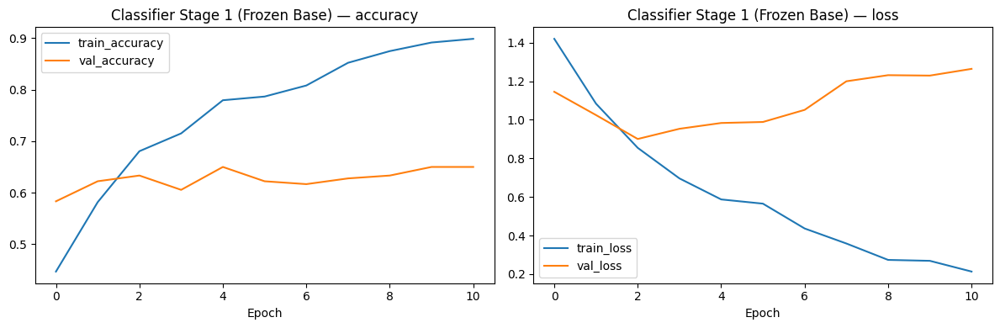

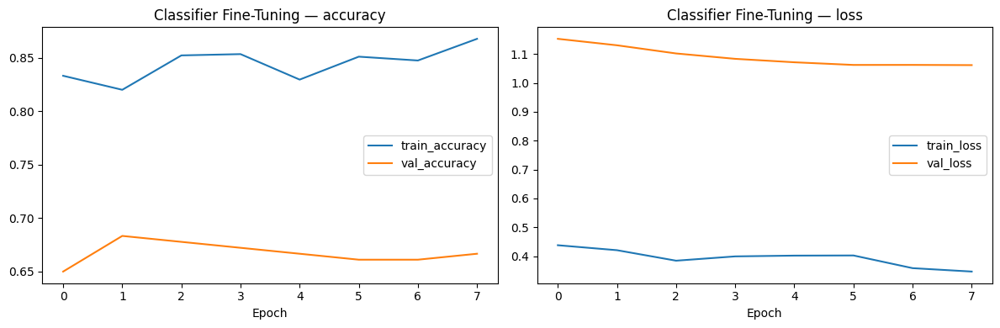

In [71]:
def plot_history(history, title, keys=('accuracy', 'loss')):
    fig, axes = plt.subplots(1, len(keys), figsize=(6 * len(keys), 4))
    if len(keys) == 1:
        axes = [axes]
    for ax, key in zip(axes, keys):
        if key in history.history:
            ax.plot(history.history[key], label=f'train_{key}')
            ax.plot(history.history[f'val_{key}'], label=f'val_{key}')
            ax.set_title(f"{title} — {key}")
            ax.set_xlabel("Epoch")
            ax.legend()
    plt.tight_layout()
    return fig

fig1 = plot_history(history_stage1, "Classifier Stage 1 (Frozen Base)")
plt.savefig(f'{CFG.REPORT_DIR}/clf_stage1_curves.png', dpi=150); plt.show()

fig2 = plot_history(history_stage3, "Classifier Fine-Tuning")
plt.savefig(f'{CFG.REPORT_DIR}/clf_finetune_curves.png', dpi=150); plt.show()

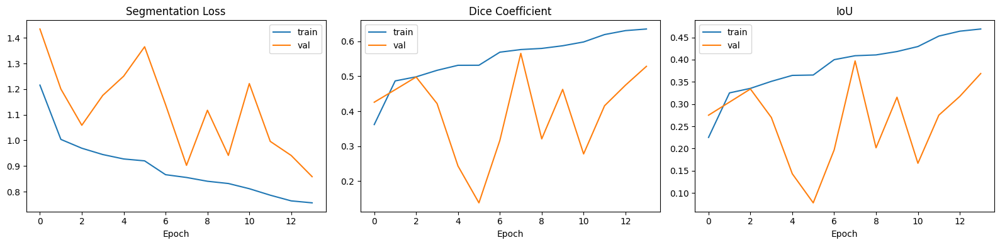

In [72]:
# Segmentation training curves: loss, Dice, IoU
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, key, title in zip(
    axes, ['loss', 'dice_coefficient', 'iou_metric'],
    ['Segmentation Loss', 'Dice Coefficient', 'IoU']
):
    ax.plot(seg_history.history[key], label='train')
    ax.plot(seg_history.history[f'val_{key}'], label='val')
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.legend()
plt.tight_layout()
plt.savefig(f'{CFG.REPORT_DIR}/segmentation_training_curves.png', dpi=150)
plt.show()


In [73]:

# Learning-rate schedule actually used (recovered from ReduceLROnPlateau logs, if tracked)
# Keras does not log LR by default unless we add it explicitly; we track it manually here
# for future runs by adding a LearningRateLogger callback. For this run, we display an
# approximation using the optimizer's current learning rate history collected during fit.
print("Final learning rate (classifier, after ReduceLROnPlateau):",
      float(clf_model.optimizer.learning_rate.numpy()))
print("Final learning rate (U-Net, after ReduceLROnPlateau):",
      float(unet_model.optimizer.learning_rate.numpy()))


Final learning rate (classifier, after ReduceLROnPlateau): 9.999999747378752e-06
Final learning rate (U-Net, after ReduceLROnPlateau): 0.0002500000118743628


Upload a vehicle image to test the full pipeline:


Saving test_Model.jpg to test_Model (1).jpg


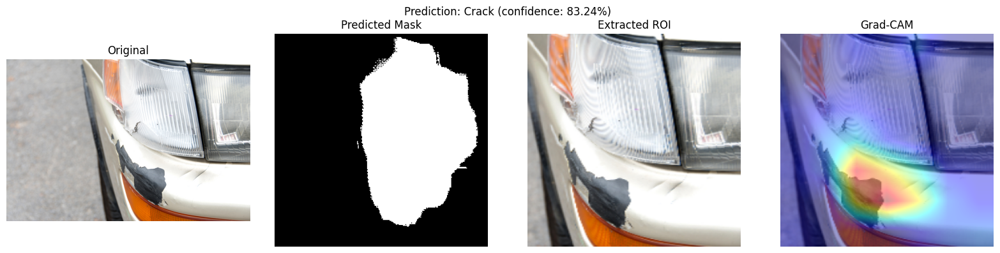

{'class': 'Crack', 'confidence': 0.8323884010314941, 'all_probs': {'Dent': 0.02901252545416355, 'Scratch': 0.11450958251953125, 'Crack': 0.8323884010314941, 'Glass Shatter': 0.0009820552077144384, 'Lamp Broken': 0.022975528612732887, 'Tire Flat': 0.00013190666504669935}}


In [76]:
# ---------------------------------------------------------------------------
# Try it: upload a new vehicle image and run the full pipeline on it
# ---------------------------------------------------------------------------
from google.colab import files as colab_files

print("Upload a vehicle image to test the full pipeline:")
uploaded_test_img = colab_files.upload()
test_img_path = list(uploaded_test_img.keys())[0]

result = predict_vehicle_damage(test_img_path)
print(result)


In [77]:
import json
import os

# ---------------------------------------------------------------------------
# Save models (already checkpointed above, but we also save final versions
# with clear names) and training histories as JSON
# ---------------------------------------------------------------------------
unet_model.save(f'{CFG.MODEL_DIR}/unet_final.keras')
clf_model.save(f'{CFG.MODEL_DIR}/efficientnet_classifier_final.keras')
model_a.save(f'{CFG.MODEL_DIR}/model_a_original_images.keras')

with open(f'{CFG.MODEL_DIR}/seg_history.json', 'w') as f:
    json.dump(seg_history.history, f)
with open(f'{CFG.MODEL_DIR}/clf_stage1_history.json', 'w') as f:
    json.dump(history_stage1.history, f)
with open(f'{CFG.MODEL_DIR}/clf_finetune_history.json', 'w') as f:
    json.dump(history_stage3.history, f)

print("All models and histories saved to", CFG.MODEL_DIR)


All models and histories saved to /content/cardd_project/models


In [78]:
# ---------------------------------------------------------------------------
# Copy the entire project (models + report figures) to Google Drive
# ---------------------------------------------------------------------------
DRIVE_TARGET = '/content/drive/MyDrive/CarDD_Vehicle_Damage_Project'
os.makedirs(DRIVE_TARGET, exist_ok=True)

shutil.copytree(CFG.MODEL_DIR, f'{DRIVE_TARGET}/models', dirs_exist_ok=True)
shutil.copytree(CFG.REPORT_DIR, f'{DRIVE_TARGET}/report', dirs_exist_ok=True)
comparison_df.to_csv(f'{DRIVE_TARGET}/model_comparison.csv')

print("Project artifacts backed up to Google Drive at:", DRIVE_TARGET)


Project artifacts backed up to Google Drive at: /content/drive/MyDrive/CarDD_Vehicle_Damage_Project


In [79]:
# ---------------------------------------------------------------------------
# Consolidated performance summary table
# ---------------------------------------------------------------------------
summary = pd.DataFrame({
    'Metric': ['Segmentation Dice', 'Segmentation IoU', 'Segmentation Pixel Accuracy',
               'Classification Accuracy', 'Precision (macro)', 'Recall (macro)',
               'F1 Score (macro)', 'Top-1 Accuracy', 'Top-3 Accuracy'],
    'Value': [seg_test_results['dice_coefficient'], seg_test_results['iou_metric'],
              seg_test_results['binary_accuracy'], acc, prec, rec, f1, top1, top3]
})
print(summary.to_string(index=False))
summary.to_csv(f'{CFG.REPORT_DIR}/performance_summary.csv', index=False)


                     Metric    Value
          Segmentation Dice 0.573207
           Segmentation IoU 0.405248
Segmentation Pixel Accuracy 0.774338
    Classification Accuracy 0.668508
          Precision (macro) 0.683035
             Recall (macro) 0.688562
           F1 Score (macro) 0.685390
             Top-1 Accuracy 0.668508
             Top-3 Accuracy 0.944751


In [80]:
# List every figure generated for the report
report_figures = sorted(os.listdir(CFG.REPORT_DIR))
print(f"{len(report_figures)} report-ready figures/tables generated in {CFG.REPORT_DIR}:")
for f in report_figures:
    print("  -", f)


21 report-ready figures/tables generated in /content/cardd_project/report:
  - activation_maps.png
  - class_distribution.png
  - clf_finetune_curves.png
  - clf_stage1_curves.png
  - confidence_histogram_v2.png
  - confusion_matrix_v2.png
  - gradcam_verification.png
  - misclassified_v2.png
  - model_comparison_chart_v2.png
  - model_comparison_v2.csv
  - per_class_accuracy_v2.png
  - performance_summary.csv
  - pr_curves_v2.png
  - preprocessing_before_after.png
  - resolution_distribution.png
  - roc_curves_v2.png
  - roi_extraction_demo.png
  - sample_images.png
  - segmentation_results.png
  - segmentation_training_curves.png
  - top3_predictions.png


In [81]:
# --- Mixed Precision Training (speeds up training on modern GPUs) ---
# NOTE: enable this BEFORE building/training a model if you want to use it live;
# shown here separately so it doesn't retroactively affect the models already trained above.
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
print("Mixed precision policy set to:", mixed_precision.global_policy())
# Remember to set the final Dense layer's dtype to float32 for numerical stability:
#   outputs = layers.Dense(n_classes, activation='softmax', dtype='float32')(x)
mixed_precision.set_global_policy('float32')  # reverted so the rest of the notebook is unaffected


Mixed precision policy set to: <DTypePolicy "mixed_float16">


In [82]:
# --- Test-Time Augmentation (TTA) ---
def predict_with_tta(model, img_rgb_uint8, n_aug=5):
    tta_transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.Rotate(limit=10, p=0.5),
    ])
    preds = []
    base = preprocess_input(cv2.resize(img_rgb_uint8, (CFG.IMG_SIZE, CFG.IMG_SIZE)).astype(np.float32))
    preds.append(model.predict(np.expand_dims(base, 0), verbose=0)[0])
    for _ in range(n_aug - 1):
        aug_img = tta_transform(image=img_rgb_uint8)['image']
        aug_img = preprocess_input(cv2.resize(aug_img, (CFG.IMG_SIZE, CFG.IMG_SIZE)).astype(np.float32))
        preds.append(model.predict(np.expand_dims(aug_img, 0), verbose=0)[0])
    return np.mean(preds, axis=0)

print("TTA function ready — averages predictions across", 5, "augmented views.")


TTA function ready — averages predictions across 5 augmented views.


In [83]:
# --- Model Size & Inference Speed ---
def get_model_size_mb(path):
    return os.path.getsize(path) / (1024 * 1024)

print(f"U-Net model size: {get_model_size_mb(f'{CFG.MODEL_DIR}/unet_final.keras'):.2f} MB")
print(f"Classifier model size: {get_model_size_mb(f'{CFG.MODEL_DIR}/efficientnet_classifier_final.keras'):.2f} MB")

# Inference speed (single image, averaged over 20 runs)
dummy_input = np.random.rand(1, CFG.IMG_SIZE, CFG.IMG_SIZE, 3).astype(np.float32)
times = []
for _ in range(20):
    t0 = time.time()
    clf_model.predict(dummy_input, verbose=0)
    times.append(time.time() - t0)
print(f"Average classifier inference time per image: {np.mean(times) * 1000:.2f} ms")


U-Net model size: 89.19 MB
Classifier model size: 50.41 MB
Average classifier inference time per image: 97.57 ms


In [84]:
# --- FLOPs Estimation ---
def estimate_flops(model):
    forward_pass = tf.function(model.call, input_signature=[
        tf.TensorSpec(shape=(1,) + model.input_shape[1:], dtype=tf.float32)
    ])
    graph_info = tf.compat.v1.profiler.profile(
        forward_pass.get_concrete_function().graph,
        options=tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
    )
    return graph_info.total_float_ops

try:
    flops = estimate_flops(clf_model)
    print(f"Estimated FLOPs for classifier (1 forward pass): {flops / 1e9:.2f} GFLOPs")
except Exception as e:
    print("FLOPs estimation requires TF1-compatible profiler API; if it fails on your TF version:")
    print("  ", e)


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.


Estimated FLOPs for classifier (1 forward pass): 0.80 GFLOPs


In [85]:
# ---------------------------------------------------------------------------
# NEW: Gamma correction and brightness normalization (the two techniques not
# already covered by Part 4's apply_clahe / apply_bilateral_filter / etc.)
# ---------------------------------------------------------------------------
def gamma_correction(img_rgb, gamma=1.2):
    '''Gamma > 1 brightens midtones (good for underexposed/poorly-lit photos),
    gamma < 1 darkens them. Built as a lookup table for speed.'''
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype(np.uint8)
    return cv2.LUT(img_rgb, table)

def brightness_normalization(img_rgb, target_mean=130):
    '''Shifts overall brightness so the image mean intensity matches
    target_mean, correcting for photos taken in poor/uneven lighting.'''
    current_mean = img_rgb.mean()
    if current_mean < 1e-6:
        return img_rgb
    shift = target_mean - current_mean
    return np.clip(img_rgb.astype(np.float32) + shift, 0, 255).astype(np.uint8)

def auto_gamma_from_brightness(img_rgb):
    '''Pick a sensible gamma automatically: darker images get a bigger boost.'''
    mean_intensity = img_rgb.mean()
    if mean_intensity < 80:
        return 1.6
    elif mean_intensity < 120:
        return 1.25
    elif mean_intensity > 190:
        return 0.8
    return 1.0

print("gamma_correction(), brightness_normalization(), auto_gamma_from_brightness() ready.")


gamma_correction(), brightness_normalization(), auto_gamma_from_brightness() ready.


In [86]:
# ---------------------------------------------------------------------------
# Unified, TOGGLE-ABLE adaptive enhancement pipeline. Every step can be
# switched on/off independently -- pass enable=False to bypass entirely and
# get the original image back, so before/after comparison is always possible.
# ---------------------------------------------------------------------------
def enhance_image_adaptive(img_rgb, enable=True, use_clahe=True, use_gamma=True,
                            use_brightness_norm=True, use_contrast=True, use_denoise=True):
    '''Apply adaptive preprocessing to improve images captured under poor
    lighting. Reuses apply_clahe()/apply_bilateral_filter()/apply_contrast_enhancement()
    from Part 4 -- this function only ADDS gamma correction + brightness
    normalization and chains everything together in a sensible order.

    Set enable=False to skip all enhancement and return the input unchanged
    (this is what lets you compare model performance before vs. after).
    '''
    if not enable:
        return img_rgb.copy()

    out = img_rgb.copy()

    if use_brightness_norm:
        out = brightness_normalization(out)
    if use_gamma:
        out = gamma_correction(out, gamma=auto_gamma_from_brightness(out))
    if use_clahe:
        out = apply_clahe(out)
    if use_contrast:
        out = apply_contrast_enhancement(out)
    if use_denoise:
        out = apply_bilateral_filter(out)

    return out


def compare_enhancement(image_path):
    '''Side-by-side before/after visualization for a single image.'''
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    enhanced = enhance_image_adaptive(img, enable=True)

    fig, axes = plt.subplots(1, 2, figsize=(11, 5))
    axes[0].imshow(img); axes[0].set_title("Original"); axes[0].axis('off')
    axes[1].imshow(enhanced); axes[1].set_title("Adaptively Enhanced"); axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    return img, enhanced

print("enhance_image_adaptive() ready -- enable=True/False toggles the whole pipeline.")
print("Use compare_enhancement(image_path) to visually check before vs. after on any image.")


enhance_image_adaptive() ready -- enable=True/False toggles the whole pipeline.
Use compare_enhancement(image_path) to visually check before vs. after on any image.


In [87]:
# ---------------------------------------------------------------------------
# Rule-based severity assessment
# ---------------------------------------------------------------------------
SEVERITY_THRESHOLDS = {'minor_max': 0.33, 'moderate_max': 0.66}
SEVERITY_WEIGHTS    = {'area': 0.60, 'shape': 0.25, 'confidence': 0.15}

def compute_shape_irregularity(binary_mask):
    '''1 - solidity. 0.0 = compact/convex, ~1.0 = jagged/branching.'''
    contours, _ = cv2.findContours(binary_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return 0.0
    largest = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(largest)
    if area < 1:
        return 0.0
    hull = cv2.convexHull(largest)
    hull_area = cv2.contourArea(hull)
    if hull_area < 1:
        return 0.0
    solidity = area / hull_area
    return float(np.clip(1 - solidity, 0, 1))


def assess_damage_severity(binary_mask, confidence, damage_class=None):
    '''Combine segmented area %, shape irregularity, and classifier confidence
    into a Minor / Moderate / Severe severity label + numeric score.'''
    total_px = binary_mask.size
    damage_px = int(binary_mask.sum())
    damage_percentage = (damage_px / total_px) * 100 if total_px > 0 else 0.0

    area_score = float(np.clip(damage_percentage / 25.0, 0, 1))
    shape_score = compute_shape_irregularity(binary_mask)
    confidence_score = float(np.clip(confidence, 0, 1))

    severity_score = (SEVERITY_WEIGHTS['area'] * area_score +
                       SEVERITY_WEIGHTS['shape'] * shape_score +
                       SEVERITY_WEIGHTS['confidence'] * confidence_score)

    if severity_score < SEVERITY_THRESHOLDS['minor_max']:
        severity = 'Minor'
    elif severity_score < SEVERITY_THRESHOLDS['moderate_max']:
        severity = 'Moderate'
    else:
        severity = 'Severe'

    if damage_class in ('Glass Shatter', 'Lamp Broken') and severity == 'Minor':
        severity = 'Moderate'

    return {
        'severity': severity,
        'severity_score': round(severity_score, 3),
        'damage_percentage': round(damage_percentage, 2),
        'shape_irregularity': round(shape_score, 3),
    }

print("assess_damage_severity() ready.")


assess_damage_severity() ready.


In [88]:
# ---------------------------------------------------------------------------
# Rule-based repair recommendations, keyed by (damage class, severity)
# ---------------------------------------------------------------------------
REPAIR_RECOMMENDATIONS = {
    'Dent':           {'Minor': ['Paintless Dent Repair (PDR)'],
                        'Moderate': ['Panel Repair', 'Filler + Repaint'],
                        'Severe': ['Panel Replacement']},
    'Scratch':        {'Minor': ['Buffing', 'Polishing'],
                        'Moderate': ['Buffing', 'Repainting'],
                        'Severe': ['Repainting', 'Panel Refinishing']},
    'Crack':          {'Minor': ['Sealant / Filler Repair'],
                        'Moderate': ['Panel Repair', 'Reinforcement'],
                        'Severe': ['Replace Component']},
    'Glass Shatter':  {'Minor': ['Windshield Repair Kit'],
                        'Moderate': ['Replace Windshield'],
                        'Severe': ['Replace Windshield']},
    'Lamp Broken':    {'Minor': ['Replace Lamp Cover'],
                        'Moderate': ['Replace Lamp'],
                        'Severe': ['Replace Lamp Assembly']},
    'Tire Flat':      {'Minor': ['Tire Puncture Repair'],
                        'Moderate': ['Tire Repair or Replacement (inspect first)'],
                        'Severe': ['Replace Tire']},
}

def get_repair_recommendation(damage_class, severity):
    '''Look up repair recommendation(s) for a (damage class, severity) pair.'''
    class_rules = REPAIR_RECOMMENDATIONS.get(damage_class)
    if class_rules is None:
        return ['Manual inspection recommended']
    return class_rules.get(severity, class_rules.get('Moderate', ['Manual inspection recommended']))

print("get_repair_recommendation() ready.")
print("Example:", get_repair_recommendation('Scratch', 'Minor'))


get_repair_recommendation() ready.
Example: ['Buffing', 'Polishing']


In [89]:
# ---------------------------------------------------------------------------
# Single consolidated figure for one assessment (Feature 6)
# ---------------------------------------------------------------------------
def plot_full_assessment_panel(original_img, enhanced_img, binary_mask, overlay_img,
                                gradcam_img, damage_class, severity, confidence,
                                recommendations, save_path=None):
    '''Builds the 6-panel stacked figure requested in Feature 6.'''
    fig, axes = plt.subplots(6, 1, figsize=(6, 22))

    panels = [
        (original_img, "1. Original Image"),
        (enhanced_img, "2. Preprocessed / Enhanced Image"),
        (binary_mask, "3. Segmented Damage Mask"),
        (overlay_img, "4. Overlay (Mask on Original)"),
        (gradcam_img, "5. Grad-CAM Explanation"),
    ]
    for ax, (img, title) in zip(axes[:5], panels):
        cmap = 'gray' if img.ndim == 2 else None
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.axis('off')

    axes[5].axis('off')
    rec_text = "\n".join(f"   - {r}" for r in recommendations)
    summary_text = (
        f"6. Prediction Panel\n\n"
        f"Damage Type   :  {damage_class}\n"
        f"Severity      :  {severity}\n"
        f"Confidence    :  {confidence:.2%}\n\n"
        f"Repair Recommendation:\n{rec_text}"
    )
    axes[5].text(0.02, 0.95, summary_text, fontsize=12, va='top', ha='left',
                 family='monospace', transform=axes[5].transAxes,
                 bbox=dict(boxstyle='round', facecolor='#f0f0f0', edgecolor='gray'))

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    return fig

print("plot_full_assessment_panel() ready.")


plot_full_assessment_panel() ready.


In [90]:
# ---------------------------------------------------------------------------
# PDF report generator
# ---------------------------------------------------------------------------
from reportlab.lib.pagesizes import A4
from reportlab.lib.units import mm
from reportlab.lib import colors
from reportlab.pdfgen import canvas as pdf_canvas
from datetime import datetime
import tempfile

def _save_temp_png(img_array, is_gray=False):
    '''Save a numpy image array to a temp PNG file (reportlab draws from files).'''
    tmp = tempfile.NamedTemporaryFile(suffix='.png', delete=False)
    if is_gray:
        plt.imsave(tmp.name, img_array, cmap='gray')
    else:
        plt.imsave(tmp.name, img_array)
    return tmp.name


def generate_pdf_report(original_img, enhanced_img, binary_mask, overlay_img, gradcam_img,
                         damage_class, severity, confidence, recommendations,
                         model_name="EfficientNetB0 + U-Net (CarDD)", output_path=None):
    '''Builds a one-page, professional PDF report (Feature 5) and returns its path.'''
    if output_path is None:
        output_path = f"{CFG.REPORT_DIR}/damage_report_{datetime.now().strftime('%Y%m%d_%H%M%S')}.pdf"

    img_paths = {
        'original': _save_temp_png(original_img),
        'enhanced': _save_temp_png(enhanced_img),
        'mask': _save_temp_png(binary_mask, is_gray=True),
        'overlay': _save_temp_png(overlay_img),
        'gradcam': _save_temp_png(gradcam_img),
    }

    c = pdf_canvas.Canvas(output_path, pagesize=A4)
    page_w, page_h = A4

    c.setFillColor(colors.HexColor('#1a3c6e'))
    c.rect(0, page_h - 25 * mm, page_w, 25 * mm, fill=True, stroke=False)
    c.setFillColor(colors.white)
    c.setFont("Helvetica-Bold", 16)
    c.drawString(15 * mm, page_h - 16 * mm, "AI Vehicle Damage Assessment Report")
    c.setFont("Helvetica", 9)
    c.drawString(15 * mm, page_h - 22 * mm, f"Generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}   |   Model: {model_name}")

    y_top = page_h - 32 * mm
    thumb_w, thumb_h = 55 * mm, 42 * mm
    positions = [
        ('original', "Original", 15 * mm, y_top - thumb_h),
        ('enhanced', "Preprocessed", 15 * mm + thumb_w + 5 * mm, y_top - thumb_h),
        ('mask', "Segmented Mask", 15 * mm + 2 * (thumb_w + 5 * mm), y_top - thumb_h),
        ('overlay', "Overlay", 15 * mm, y_top - 2 * thumb_h - 10 * mm),
        ('gradcam', "Grad-CAM", 15 * mm + thumb_w + 5 * mm, y_top - 2 * thumb_h - 10 * mm),
    ]
    c.setFillColor(colors.black)
    for key, label, x, y in positions:
        c.drawImage(img_paths[key], x, y, width=thumb_w, height=thumb_h, preserveAspectRatio=True, anchor='c')
        c.setFont("Helvetica-Bold", 9)
        c.drawCentredString(x + thumb_w / 2, y - 4 * mm, label)

    box_y = y_top - 2 * thumb_h - 25 * mm
    c.setStrokeColor(colors.HexColor('#1a3c6e'))
    c.setLineWidth(1)
    c.rect(15 * mm, box_y - 45 * mm, page_w - 30 * mm, 45 * mm, fill=False, stroke=True)

    c.setFont("Helvetica-Bold", 12)
    c.setFillColor(colors.HexColor('#1a3c6e'))
    c.drawString(20 * mm, box_y - 8 * mm, "Prediction Summary")

    c.setFont("Helvetica", 11)
    c.setFillColor(colors.black)
    lines = [
        f"Damage Type       :  {damage_class}",
        f"Severity          :  {severity}",
        f"Confidence Score  :  {confidence:.2%}",
        f"Repair Recommendation:",
    ] + [f"    - {r}" for r in recommendations]

    ty = box_y - 15 * mm
    for line in lines:
        c.drawString(20 * mm, ty, line)
        ty -= 5 * mm

    c.setFont("Helvetica-Oblique", 8)
    c.setFillColor(colors.gray)
    c.drawString(15 * mm, 10 * mm, "Auto-generated by the AI-Based Vehicle Damage Assessment System.")

    c.showPage()
    c.save()

    for p in img_paths.values():
        os.remove(p)

    print(f"PDF report saved to: {output_path}")
    return output_path

print("generate_pdf_report() ready.")


generate_pdf_report() ready.


In [91]:
# ---------------------------------------------------------------------------
# Master pipeline function
# ---------------------------------------------------------------------------
def run_full_assessment(image_path, apply_enhancement=True, save_pdf=True, show_panel=True):
    '''
    End-to-end assessment for one image, combining every existing component
    (U-Net segmentation, ROI extraction, EfficientNetB0 classification,
    Grad-CAM) with the new severity, recommendation, visualization, and PDF
    report features.
    '''
    original_img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    enhanced_img = enhance_image_adaptive(original_img, enable=apply_enhancement)

    seg_input = cv2.resize(enhanced_img, (CFG.SEG_SIZE, CFG.SEG_SIZE)).astype(np.float32) / 255.0
    mask_pred = unet_model.predict(np.expand_dims(seg_input, 0), verbose=0)[0]
    binary_mask = (mask_pred.squeeze() > 0.5).astype(np.uint8)

    roi = extract_roi((seg_input * 255).astype(np.uint8), binary_mask)
    roi_resized = cv2.resize(roi, (IMG_SIZE, IMG_SIZE))
    clf_input = preprocess_input(roi_resized.astype(np.float32))

    probs = clf_model.predict(np.expand_dims(clf_input, 0), verbose=0)[0]
    pred_idx = int(np.argmax(probs))
    damage_class = CLASS_NAMES[pred_idx]
    confidence = float(probs[pred_idx])

    severity_info = assess_damage_severity(binary_mask, confidence, damage_class)
    severity = severity_info['severity']

    heatmap, _ = make_gradcam_heatmap(np.expand_dims(clf_input, 0), clf_model,
                                       LAST_CONV_LAYER_NAME, pred_index=pred_idx)
    gradcam_img = overlay_heatmap(roi_resized, heatmap)

    recommendations = get_repair_recommendation(damage_class, severity)

    overlay_display = enhanced_img.copy()
    mask_disp = cv2.resize(binary_mask, (enhanced_img.shape[1], enhanced_img.shape[0]),
                            interpolation=cv2.INTER_NEAREST)
    overlay_display[mask_disp > 0] = [255, 0, 0]
    overlay_display = cv2.addWeighted(enhanced_img, 0.6, overlay_display, 0.4, 0)

    print("=" * 50)
    print(f"Damage Type : {damage_class}")
    print(f"Severity    : {severity}  (score={severity_info['severity_score']}, "
          f"area={severity_info['damage_percentage']}%, shape_irregularity={severity_info['shape_irregularity']})")
    print(f"Confidence  : {confidence:.2%}")
    print("Recommendation:")
    for r in recommendations:
        print(f"   - {r}")
    print("=" * 50)

    panel_save_path = f"{CFG.REPORT_DIR}/assessment_panel_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
    if show_panel:
        plot_full_assessment_panel(original_img, enhanced_img, mask_disp, overlay_display,
                                    gradcam_img, damage_class, severity, confidence,
                                    recommendations, save_path=panel_save_path)

    pdf_path = None
    if save_pdf:
        pdf_path = generate_pdf_report(original_img, enhanced_img, mask_disp, overlay_display,
                                        gradcam_img, damage_class, severity, confidence,
                                        recommendations)

    return {
        'damage_class': damage_class,
        'confidence': confidence,
        'severity': severity,
        'severity_details': severity_info,
        'recommendations': recommendations,
        'pdf_report_path': pdf_path,
        'panel_image_path': panel_save_path if show_panel else None,
    }

print("run_full_assessment() ready -- this is the new Feature 9 master pipeline.")


run_full_assessment() ready -- this is the new Feature 9 master pipeline.


Upload a vehicle image to run the FULL assessment pipeline (enhancement + segmentation + classification + severity + Grad-CAM + PDF report):


Saving test_Model.jpg to test_Model (2).jpg
Damage Type : Lamp Broken
Severity    : Severe  (score=0.689, area=47.81%, shape_irregularity=0.065)
Confidence  : 48.66%
Recommendation:
   - Replace Lamp Assembly


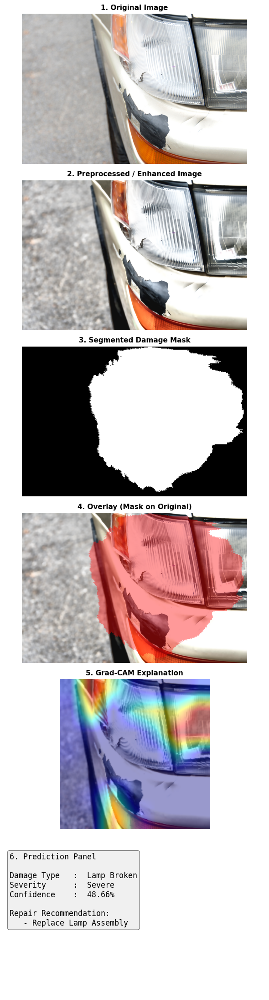

PDF report saved to: /content/cardd_project/report/damage_report_20260720_035146.pdf
{'damage_class': 'Lamp Broken', 'confidence': 0.48663491010665894, 'severity': 'Severe', 'severity_details': {'severity': 'Severe', 'severity_score': 0.689, 'damage_percentage': 47.81, 'shape_irregularity': 0.065}, 'recommendations': ['Replace Lamp Assembly'], 'pdf_report_path': '/content/cardd_project/report/damage_report_20260720_035146.pdf', 'panel_image_path': '/content/cardd_project/report/assessment_panel_20260720_035143.png'}


In [92]:
from google.colab import files as colab_files_v2

print("Upload a vehicle image to run the FULL assessment pipeline "
      "(enhancement + segmentation + classification + severity + Grad-CAM + PDF report):")
uploaded_v2 = colab_files_v2.upload()
test_image_path_v2 = list(uploaded_v2.keys())[0]

result = run_full_assessment(test_image_path_v2, apply_enhancement=True, save_pdf=True, show_panel=True)
print(result)
